## script plots coordinates of bodyparts and their exposure to a gradient

In [223]:
#Importing the toolbox (takes several seconds)
import pandas as pd
from pathlib import Path
import numpy as np
import os
import matplotlib.pyplot as plt
import tifffile as tiff
from natsort import natsorted
import track_plotting_functions as track_plot

In [224]:
path='/groups/zimmer/Daniel_Mitic/data/ulises_chemotaxis/2020-07-01_13-21-00_chemotaxisl_worm1-TablePosRecord_bodypart_coordinates.csv_bodypart_coordinates_concentration.csv'

In [225]:
bodypart_coordinates_concentration=pd.read_csv(path)
bodypart_coordinates_concentration.head()

,Unnamed: 0,absolute_x_Head,absolute_y_Head,absolute_x_Tail,absolute_y_Tail,x_center,y_center,seconds,concentration_absolute_x_Head,concentration_absolute_x_Tail,concentration_x_center,change_in_concentration_absolute_x_Head,change_in_concentration_absolute_x_Tail,change_in_concentration_x_center
0,0,12.259347,12.330343,12.301606,12.593304,12.3617,12.4125,0.000000,0.002846,0.002764,0.002651,NaN,NaN,NaN
1,1,12.583785,12.263278,12.625420,12.490605,12.6873,12.3068,0.005988,0.002273,0.002209,0.002116,-0.000573,-5.551789e-04,-0.000535
2,2,12.582258,12.263278,12.625268,12.490605,12.6873,12.3068,0.011976,0.002276,0.002209,0.002116,0.000002,2.323178e-07,0.000000
3,3,12.579995,12.263278,12.624561,12.490605,12.6873,12.3068,0.017964,0.002279,0.002210,0.002116,0.000004,1.082094e-06,0.000000
4,4,12.577847,12.263278,12.624416,12.490666,12.6873,12.3068,0.023952,0.002283,0.002210,0.002116,0.000003,2.219788e-07,0.000000


In [226]:

#ADDITIONAL ARGUMENTS: optional: resolution, figsize, subsection selected by coordinates, subsection selected by frames. 
def plot_bodypart_coordinates(bodypart_coordinates,*bodyparts_to_plot,resolution=300,figsize_x=10,figsize_y=5,line_width=1):
    fig, ax = plt.subplots(1,1, figsize = (figsize_x,figsize_y), dpi=resolution)

    #get part of the df not containing concentration and grab coulumns
    bodypart_coordinates=bodypart_coordinates[bodypart_coordinates.columns[pd.Series(bodypart_coordinates.columns).str.contains('concentration')==False]]

    #from all coordinates grab only the specified ones.
    for i in range(len(bodyparts_to_plot)):
        current_bodypart=bodyparts_to_plot[i]
        current_bodypart_coordinates=bodypart_coordinates[bodypart_coordinates.columns[pd.Series(bodypart_coordinates.columns).str.contains(current_bodypart)]]
    
        # grab x coordinate from current bodypart
        x_coords_current_bodypart=current_bodypart_coordinates[current_bodypart_coordinates.columns[pd.Series(current_bodypart_coordinates.columns).str.contains('x')]]
   
        #grab y coordinates from current bodypart
        y_coords_current_bodypart=current_bodypart_coordinates[current_bodypart_coordinates.columns[pd.Series(current_bodypart_coordinates.columns).str.contains('y')]]
    
        #plot
        ax.plot(x_coords_current_bodypart,y_coords_current_bodypart,label=current_bodypart,linewidth=line_width)
    
    ax.legend()
    ax.set_aspect(0.8)
    
    ax.axvline(x=0, ymin=0, ymax=1, lw=5, alpha=.5, color='y')

    return ax
    
    
    
    

Text(0, 0.5, 'Y position (mm)')

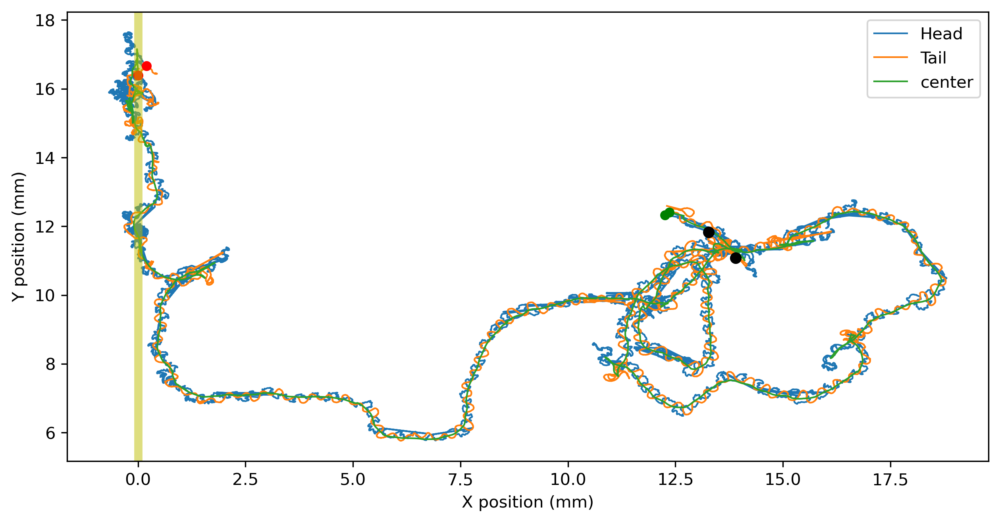

In [279]:
#plot a track. change center to Center in the bodypart coordiante script to be consistent
ax=plot_bodypart_coordinates(bodypart_coordinates_concentration,'Head','Tail','center')

#mark specific frames
frames_of_interest=[1000,3250]
for i in range(len(frames_of_interest)):
    ax.plot(bodypart_coordinates_concentration['absolute_x_Head'][frames_of_interest[i]],bodypart_coordinates_concentration['absolute_y_Head'][frames_of_interest[i]], 'ko')

    
ax.plot(x_coords_current_bodypart.values[0],y_coords_current_bodypart.values[0], 'go', markersize=5)
ax.plot(x_coords_current_bodypart.tail(1),y_coords_current_bodypart.tail(1), 'ro', markersize=5)
#some additions
plt.xlabel('X position (mm)')
plt.ylabel('Y position (mm)')

In [228]:
#plotting subsections

In [280]:
def positon_time_conversion(bodypart_coordinates,bodypart,begin_x,end_x,begin_y,end_y):
    """
    
    bodypart on which coordinates are based
    determines the range of frames in which a specific part of the track occures
    Parameters
    -------------
    concentration_change: dataframe with coordinate and concentration
    begin_x,end_x,begin_y,end_y : float,integer coordinates to determine begin and end of the track section.
    
    """
    
    
    
    bodypart_coordinates=bodypart_coordinates[bodypart_coordinates.columns[pd.Series(bodypart_coordinates.columns).str.contains('concentration')==False]]
    
    specified_bodypart=bodypart_coordinates[bodypart_coordinates.columns[pd.Series(bodypart_coordinates.columns).str.contains(bodypart)]]
    
    x_coordinates_specified_bodypart=specified_bodypart[specified_bodypart.columns[pd.Series(specified_bodypart.columns).str.contains('x')]]
    y_coordinates_specified_bodypart=specified_bodypart[specified_bodypart.columns[pd.Series(specified_bodypart.columns).str.contains('y')]]
    
    
    specified_bodypart_name_x=x_coordinates_specified_bodypart.columns[0]
    specified_bodypart_name_y=y_coordinates_specified_bodypart.columns[0]
    
    
    position=bodypart_coordinates[(bodypart_coordinates[specified_bodypart_name_x].between(begin_x,end_x))
    & (bodypart_coordinates[specified_bodypart_name_y].between(begin_y, end_y))]
    
    first_frame=position.index.min()
    last_frame=position.index.max()
    
    
    return (position,first_frame,last_frame)

In [281]:
bodypart_coordinates_concentration

,Unnamed: 0,absolute_x_Head,absolute_y_Head,absolute_x_Tail,absolute_y_Tail,x_center,y_center,seconds,concentration_absolute_x_Head,concentration_absolute_x_Tail,concentration_x_center,change_in_concentration_absolute_x_Head,change_in_concentration_absolute_x_Tail,change_in_concentration_x_center
0,0,12.259347,12.330343,12.301606,12.593304,12.3617,12.4125,0.000000,0.002846,0.002764,0.002651,NaN,NaN,NaN
1,1,12.583785,12.263278,12.625420,12.490605,12.6873,12.3068,0.005988,0.002273,0.002209,0.002116,-0.000573,-5.551789e-04,-0.000535
2,2,12.582258,12.263278,12.625268,12.490605,12.6873,12.3068,0.011976,0.002276,0.002209,0.002116,0.000002,2.323178e-07,0.000000
3,3,12.579995,12.263278,12.624561,12.490605,12.6873,12.3068,0.017964,0.002279,0.002210,0.002116,0.000004,1.082094e-06,0.000000
4,4,12.577847,12.263278,12.624416,12.490666,12.6873,12.3068,0.023952,0.002283,0.002210,0.002116,0.000003,2.219788e-07,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199996,199996,0.185842,16.672020,0.402163,16.455799,0.0021,16.3924,1197.580838,0.925709,0.914698,0.934018,-0.000042,5.416837e-06,0.000004
199997,199997,0.188273,16.671920,0.402163,16.455699,0.0021,16.3923,1197.586826,0.925592,0.914698,0.934018,-0.000116,0.000000e+00,0.000000
199998,199998,0.192050,16.671920,0.402063,16.455100,0.0020,16.3923,1197.592814,0.925412,0.914703,0.934023,-0.000181,5.416525e-06,0.000004
199999,199999,0.193533,16.668119,0.401963,16.455100,0.0019,16.3923,1197.598802,0.925341,0.914708,0.934027,-0.000071,5.416213e-06,0.000004


In [282]:
rect = patches.Rectangle((position['absolute_x_Head'].min(), position['absolute_y_Head'].min()),
    abs(position['absolute_x_Head'].min()-position['absolute_x_Head'].max()), abs(position['absolute_y_Head'].min()-position['absolute_y_Head'].max()), linewidth=1, edgecolor='k', facecolor='none')
    
    ax[0].add_patch(rect)

IndentationError: unexpected indent (<ipython-input-282-85dd214c1e41>, line 4)

In [287]:
# this works now
begin_x=0.3
end_x=2
begin_y=4
end_y=9.7
position,first_frame,last_frame=positon_time_conversion(bodypart_coordinates_concentration,'Tail',begin_x,end_x,begin_y,end_y)
print(first_frame)
print(last_frame)
#position=bodypart_coordinates_concentration[99173:114000]#['absolute_x_Head']

102526
114960


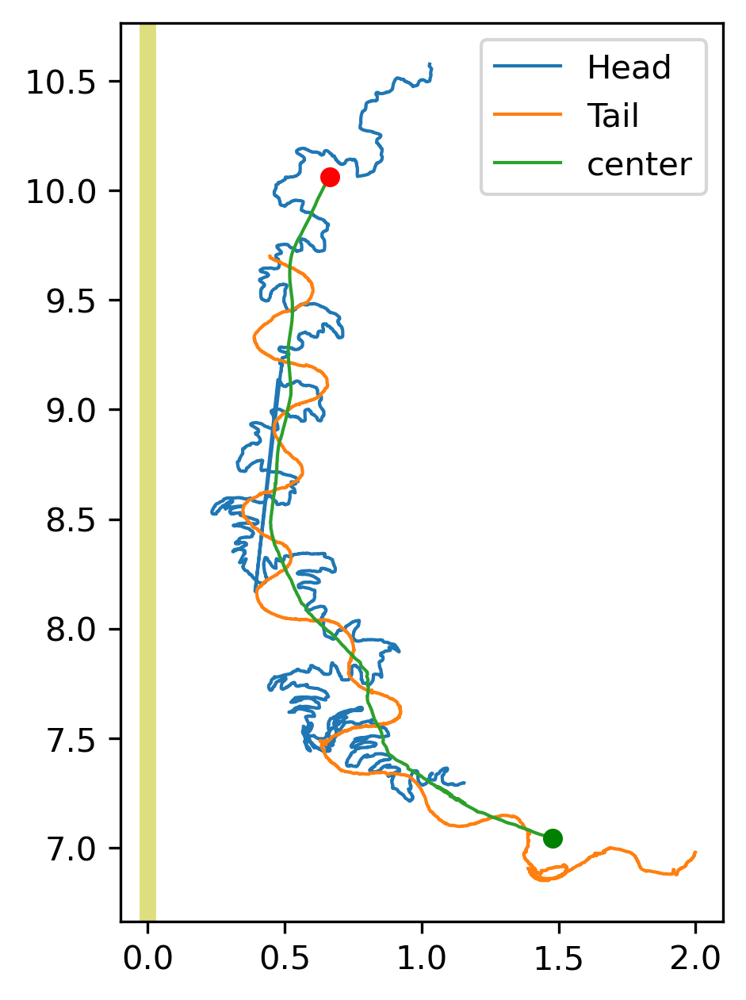

In [288]:
ax=plot_bodypart_coordinates(position,'Head','Tail','center')

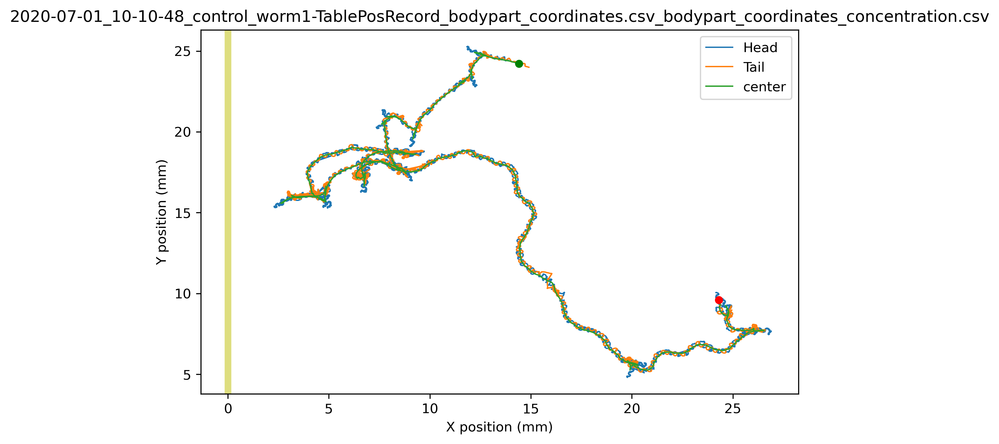

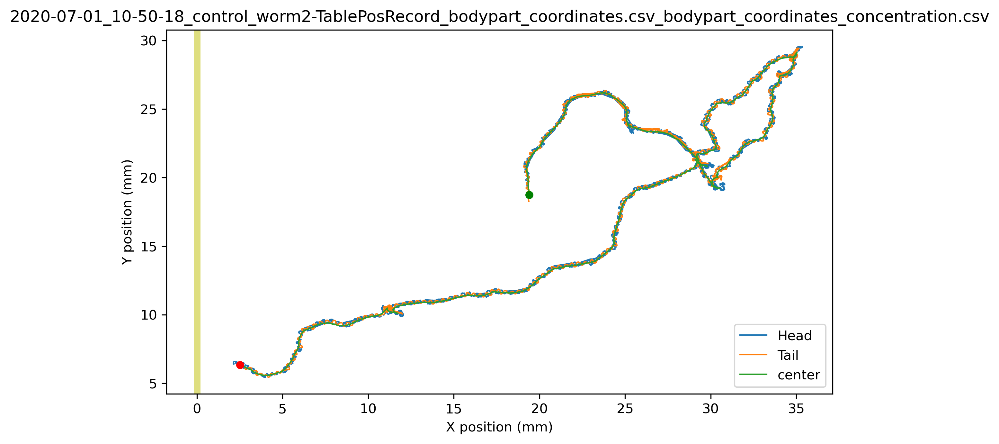

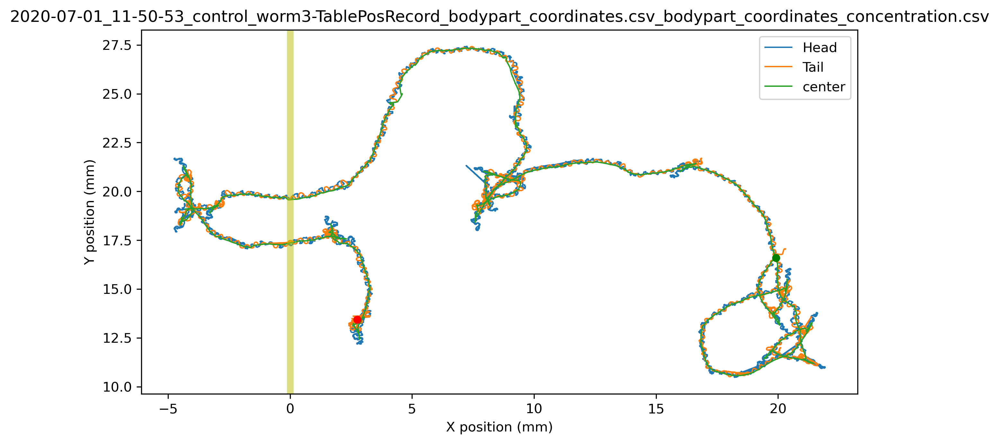

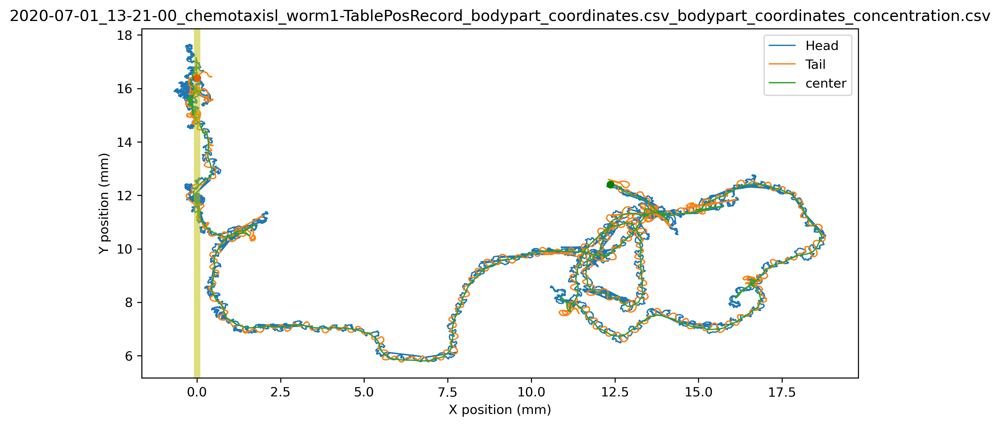

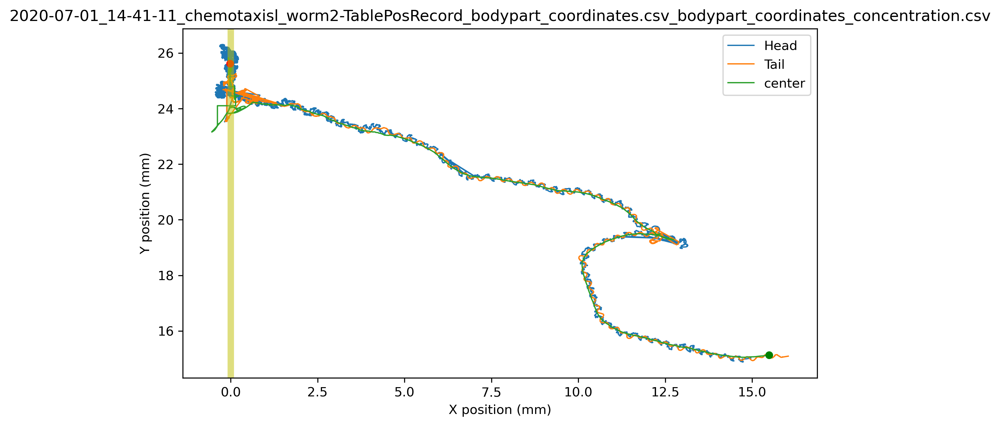

...

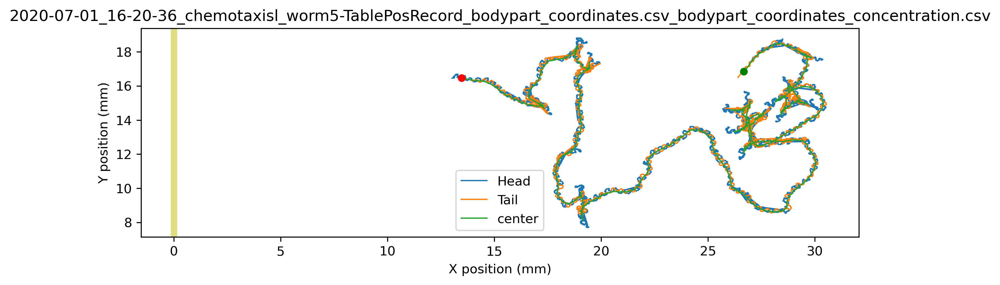

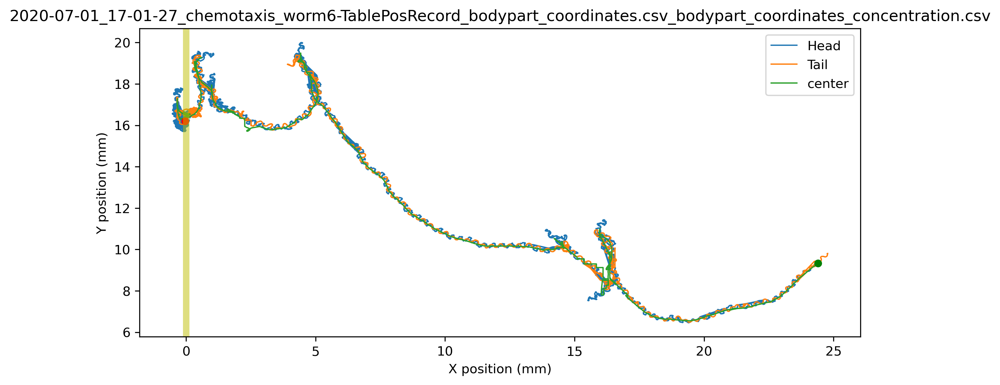

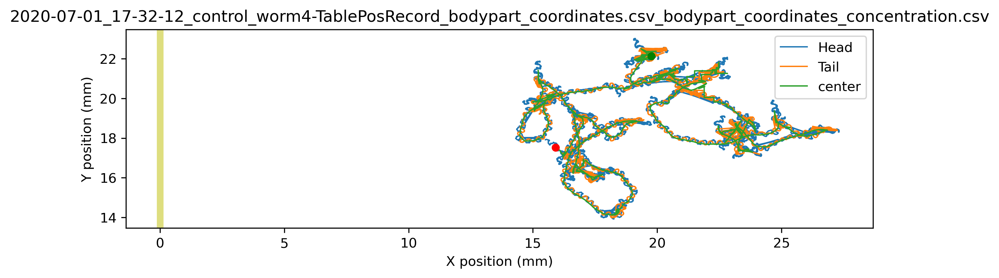

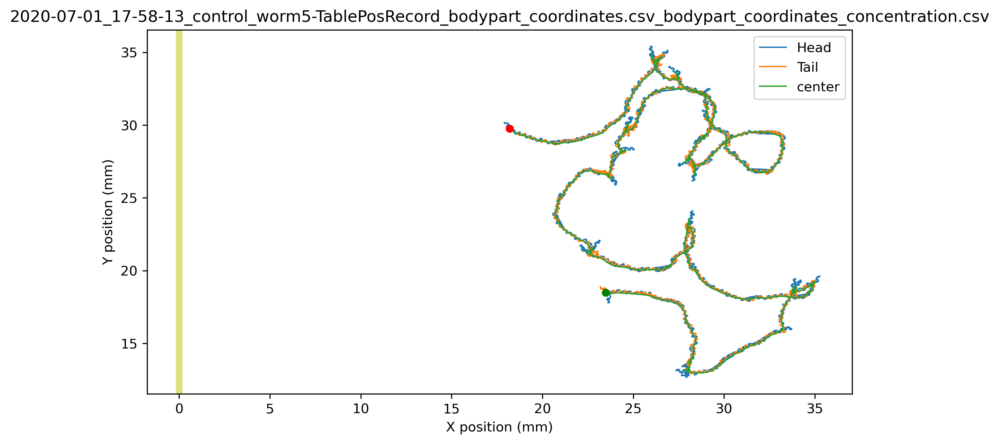

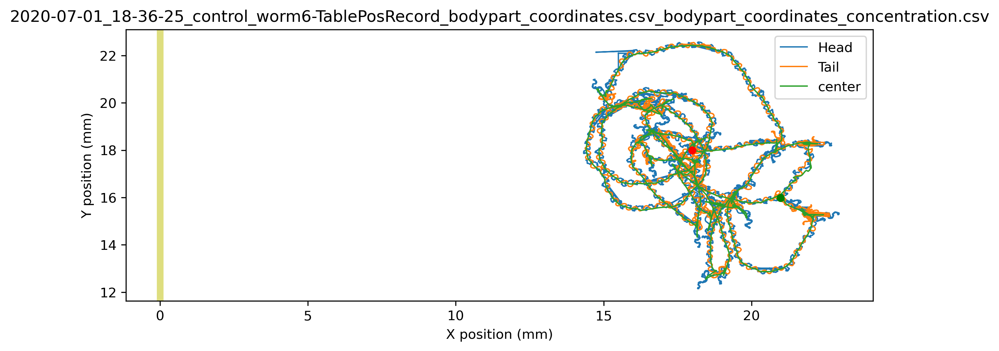

In [94]:
figsize_x=10
figsize_y=5
line_width=0.1

path=Path('/groups/zimmer/Daniel_Mitic/data/ulises_chemotaxis/')
#plot all tracks for center head and tail
for filename in path.glob('*TablePosRecord_bodypart_coordinates.csv_bodypart_coordinates_concentration.csv'):
    bodypart_coordinates_concentration=pd.read_csv(filename)
    ax=plot_bodypart_coordinates(bodypart_coordinates_concentration,'Head','Tail','center')
    plt.title(filename.name)
    plt.xlabel('X position (mm)')
    plt.ylabel('Y position (mm)')
    #ax.set_xlim(-2,43)
    #ax.set_ylim(0,40)
    
    #plt.savefig(path+filename+'.png')

# plot cumulative concentration to check

In [ ]:
#concentraton as a function of time
line_width=0.5
x=df_head_tail_center_coords['seconds']
head_conc=df_head_tail_center_coords['concentration_absolute_x_Head']
tail_conc=df_head_tail_center_coords['concentration_absolute_x_Tail']
center_conc=df_head_tail_center_coords['concentration_x_center']


fig, ax = plt.subplots(1,1, figsize = (10,5), dpi=800)
ax.plot(x,head_conc,label="head",linewidth=line_width)
ax.plot(x,tail_conc,label="tail",linewidth=line_width)
ax.plot(x,center_conc,label="center",linewidth=line_width)
ax.set_xlabel('seconds')
ax.set_ylabel('Concentration')
ax.legend()
plt.show()

## plot concentration over time

In [ ]:
#concentraton and time for all tracks
path='/groups/zimmer/Daniel_Mitic/data/ulises_chemotaxis/head_tail_center_absolute_coordinates_x_ref_corrected_concentration/'
line_width=0.1
x=np.arange(200001)

for filename in natsorted(os.listdir(path)):
    if fnmatch.fnmatch(filename, '*.csv'):
        concentration_change=pd.read_csv(path+filename)
        head_conc=concentration_change['concentration_head']
        tail_conc=concentration_change['concentration_tail']
        center_conc=concentration_change['concentration_center']

        xfig3, ax3 = plt.subplots(1,1, figsize = (10,5), dpi=600)
        ax3.plot(x,head_conc,label="head",linewidth=line_width)
        ax3.plot(x,tail_conc,label="tail",linewidth=line_width)
        ax3.plot(x,center_conc,label="center",linewidth=line_width)
        plt.title(filename)
        plt.xlabel('time')
        plt.legend()
        plt.ylabel('concentration')
        plt.ylim([0,1])
        #plt.savefig(path+filename+'.png')

# histogram with concentration changes for all worms

In [ ]:
#histogram concentration change for all worms
path='/groups/zimmer/Daniel_Mitic/data/ulises_chemotaxis/head_tail_center_absolute_coordinates_x_ref_corrected_concentration/'
output_path='/groups/zimmer/shared_projects/DanielMitic/data/ulises_chemotaxis/'
bins = np.linspace(-0.0015, 0.0015, 500)
for filename in natsorted(os.listdir(path)):
    if fnmatch.fnmatch(filename, '*.csv'):
        print(filename)
        concentration_change=pd.read_csv(path+filename)
        head_conc=concentration_change['concentration_change_head']
        tail_conc=concentration_change['concentration_change_tail']
        center_conc=concentration_change['concentration_change_center']
        plt.xticks(np.arange(-0.0015, 0.0015, step=0.00005)) 
        plt.hist(head_conc, bins, alpha=0.5, label='head_conc')
        plt.hist(tail_conc, bins, alpha=0.5, label='tail_conc')
        plt.hist(center_conc, bins, alpha=0.5, label='center_conc')
        plt.legend(loc='upper right')
        plt.ylim(0, 10000)
        plt.xlim(-0.00015, 0.00015)
        #plt.savefig(output_path+filename+'.png')
        plt.show()

# plot specific parts of tracks

In [ ]:
path='/groups/zimmer/Daniel_Mitic/data/2020-07-01_13-21-00_chemotaxisl_worm1.csv'
concentration_change=pd.read_csv(path, low_memory=False)
concentration_change

In [ ]:
figx_size=10
figy_size=5
resolution=100
linewidth=0.120
ax=track_plot.plot_tracks_center_head_tail(concentration_change,figx_size,figy_size,linewidth,resolution)
ax.set_xlim(-1,44)

In [ ]:
def position_to_time(concentration_change,begin_x,end_x,begin_y,end_y):
    """
    determines the range of frames in which a specific part of the track occures
    Parameters
    -------------
    concentration_change: dataframe with coordinate and concentration
    begin_x,end_x,begin_y,end_y : float,integer coordinates to determine begin and end of the track section.
    
    """

    position=concentration_change[(concentration_change['absolute_x_Head'].between(begin_x,end_x))
    & (concentration_change['absolute_y_Head'].between(begin_y, end_y))]
    return(position)

In [ ]:
def plot_track_section(concentration_change,position):
    
    """
    plots specific part of the track
    Parameters:
    ---------------
    concentration_change: dataframe with coordinate and concentration
    position: output from position_to_time function. specific part of the track
    
    """
    figsize_x=10
    figsize_y=10
    line_width=0.5
    fontsize=15

    #plot track
    head_pos_x=concentration_change['absolute_x_Head']
    tail_pos_x=concentration_change['absolute_x_Tail']
    center_pos_x=concentration_change['x_center']

    head_pos_y=concentration_change['absolute_y_Head']
    tail_pos_y=concentration_change['absolute_y_Tail']
    center_pos_y=concentration_change['y_center']
    
    print('lenght of section: '+str(position['seconds'].max()-position['seconds'].min())+' secs')
    fig, ax = plt.subplots(figsize = (figsize_x,figsize_y), dpi=600,ncols=1,nrows=2)
    for axis in ax:
        axis.set_ylabel('Y (mm)')
        axis.set_xlabel('X (mm)')
        axis.set_yticks(np.arange(round(min(head_pos_y)), max(head_pos_y), 1))
        axis.tick_params(axis="y", labelsize=fontsize)
        axis.set_xticks(np.arange(round(min(tail_pos_x)), max(tail_pos_x), 1))
        axis.tick_params(axis="x", labelsize=fontsize)
    
    ax[0].plot(head_pos_x,head_pos_y,linewidth=line_width,label='head')
    #ax[0].plot(tail_pos_x,tail_pos_y,linewidth=line_width,label='tail')
    ax[0].plot(center_pos_x,center_pos_y,linewidth=line_width,label='center')
    ax[0].axvline(x=0, ymin=0, ymax=1, lw=10, alpha=.5, color='y')
    
    rect = patches.Rectangle((position['absolute_x_Head'].min(), position['absolute_y_Head'].min()),
    abs(position['absolute_x_Head'].min()-position['absolute_x_Head'].max()), abs(position['absolute_y_Head'].min()-position['absolute_y_Head'].max()), linewidth=1, edgecolor='k', facecolor='none')
    ax[0].add_patch(rect)
    
    ax[0].legend(fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    #determining part for zoom
    ax[1].plot(head_pos_x,head_pos_y,linewidth=line_width,label='head')
    #ax[1].plot(tail_pos_x,tail_pos_y,linewidth=line_width,label='tail')
    ax[1].plot(center_pos_x,center_pos_y,linewidth=line_width,label='center')
    ax[1].set_xlim(position['absolute_x_Head'].min(),position['absolute_x_Head'].max())
    ax[1].set_ylim(position['absolute_y_Head'].min(),position['absolute_y_Head'].max())
    plt.axvline(x=0, ymin=0, ymax=1, lw=10, alpha=.5, color='y')
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.3)
    ax[1].legend(fontsize=15)
    80.76047904191614 secs

In [ ]:
figsize_x=5
figsize_y=5
line_width=0.7
fontsize=15

position=position[10810:11812]

head_pos_x=position['absolute_x_Head']
tail_pos_x=position['absolute_x_Tail']
center_pos_x=position['x_center']

head_pos_y=position['absolute_y_Head']
tail_pos_y=position['absolute_y_Tail']
center_pos_y=position['y_center']

print('lenght of section: '+str(position['seconds'].max()-position['seconds'].min())+' secs')
fig, ax = plt.subplots(figsize = (figsize_x,figsize_y), dpi=600,ncols=1,nrows=1)
ax.scatter(head_pos_x,head_pos_y,linewidth=line_width,label='head',s=0.2)
ax.plot(center_pos_x,center_pos_y,linewidth=line_width,label='center',color='#ff7f0e')
ax.legend(fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
#ax.set_ylabel('Y (mm)')
#ax.set_xlabel('X (mm)')
ax.tick_params(axis="x", labelsize=fontsize)
ax.set_xlim(0.5,2)
ax.set_ylim(6.5,9.5)
ax.get_xaxis().set_ticks([])
ax.get_yaxis().set_ticks([])

In [ ]:
begin_x=0.3
end_x=2
begin_y=4
end_y=9.7
position=position_to_time(concentration_change,begin_x,end_x,begin_y,end_y)
position
plot_track_section(concentration_change,position)

In [ ]:
1.7/5.5

In [ ]:
5/x=0.3

In [ ]:
5/8

In [ ]:
def plot_concentration_section(concentration_change,position):
    
    """"
    plots concentration of speciific part of the track
    Parameters:
    --------------------
    concentration_change: dataframe with coordinate and concentration
    position: output from position_to_time function. specific part of the track
    """
    
    line_width=0.5
    figsize_x=10
    figsize_y=10
    line_width=0.5
    fontsize=8

    x=concentration_change['seconds']
    head_conc=concentration_change['concentration_Head']
    tail_conc=concentration_change['concentration_Tail']
    center_conc=concentration_change['concentration_Center']
    fig, ax = plt.subplots(figsize = (figsize_x,figsize_y), dpi=600,ncols=1,nrows=2)
    for axis in ax:
        axis.set_ylabel('Concentration',fontsize=15)
        axis.set_xlabel('time (seconds)',fontsize=15)
        axis.tick_params(axis="y", labelsize=fontsize)
        axis.tick_params(axis="x", labelsize=fontsize)
        
    ax[0].plot(x,head_conc,label="head",linewidth=line_width)
    #ax[0].plot(x,tail_conc,label="tail",linewidth=line_width)
    ax[0].plot(x,center_conc,label="center",linewidth=line_width)
    rect = patches.Rectangle((position['seconds'].min(), position['concentration_Head'].iloc[0]),position['seconds'].max()-position['seconds'].min(),
    abs(position['concentration_Head'].iloc[0]-position['concentration_Head'].iloc[-1]), linewidth=1, edgecolor='k', facecolor='none')
    ax[0].add_patch(rect)
    ax[0].set_yticks(np.arange(0, 1.1, 0.1))
    ax[0].set_xticks(np.arange(round(min(x)), max(x), 120))
    ax[0].legend(fontsize=15)
    ax[0].tick_params(axis='both', which='major', labelsize=15)
    
    
    ax[1].plot(x,head_conc,label="head",linewidth=line_width)
    #ax[1].plot(x,tail_conc,label="tail",linewidth=line_width)
    ax[1].plot(x,center_conc,label="center",linewidth=line_width)
    #if you plot subsection just by changing plot limits it distorts the image
    ax[1].set_ylim(position['concentration_Head'].iloc[0],position['concentration_Head'].iloc[-1])
    ax[1].set_xlim(position['seconds'].min(),position['seconds'].max())
    ax[1].legend(fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

In [ ]:
select_indices = list(np.where(position["seconds"] == 670))
#index=select_indices[0]
select_indices

In [ ]:
position[10810:11812]

In [ ]:
figsize_x=20
figsize_y=10
line_width=0.9
fontsize=15

x=position['seconds']
head_conc=position['concentration_Head']
center_conc=position['concentration_Center']

fig, ax = plt.subplots(figsize = (figsize_x,figsize_y), dpi=600,ncols=1,nrows=1)

#ax.set_ylabel('Concentration',fontsize=15)
#ax.set_xlabel('time (seconds)',fontsize=15)
ax.tick_params(axis="y", labelsize=fontsize)
ax.tick_params(axis="x", labelsize=fontsize)
        
ax.plot(x,head_conc,label="head",linewidth=line_width)
ax.plot(x,center_conc,label="center",linewidth=line_width,color='#ff7f0e')
    
ax.set_yticks(np.arange(0, 1.1, 0.1))
ax.set_xticks(np.arange(round(min(x)), max(x), 120))
ax.legend(fontsize=15)
ax.tick_params(axis='both', which='major', labelsize=15)

ax.set_yticks(np.arange(0, 1.1, 0.1))
ax.set_xticks(np.arange(round(min(x)), max(x), 3))


ax.set_ylim(position['concentration_Head'].iloc[0],0.9)
ax.set_xlim(630,680)
#ax.set_xticks([])
#ax.set_yticks([])


## plot corresponding concentration

In [ ]:
plot_concentration_section(concentration_change,position)

               time       X        Y
30000  18:20:39.326 -3.2008 -24.8312


(-1.0, -4.0)

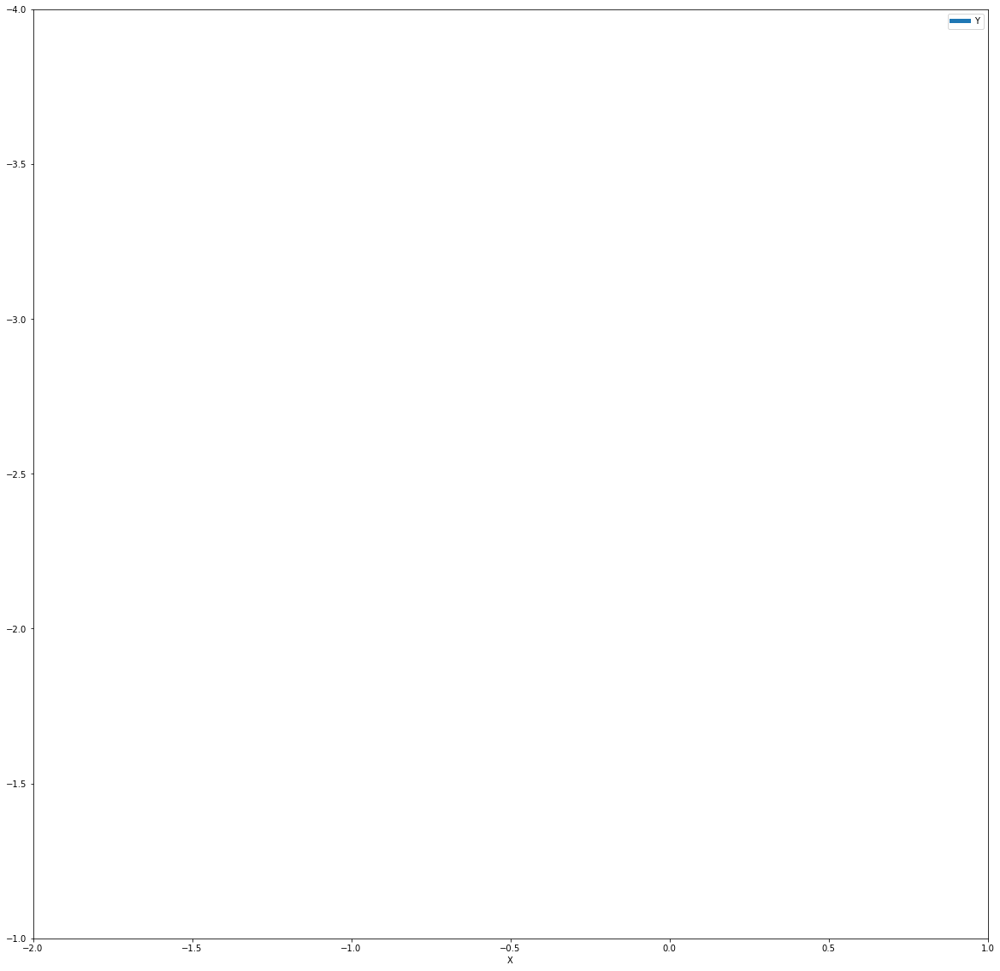

In [4]:
#path='/Volumes/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/all_tracks/2020-06-30_17-47-20_chemotaxis_worm4-TablePosRecord.txt'
path=path='/scratch/zimmer/DanielM/bag_zim_06/9.9/2021-09-06bag_zim06/raw/2021-09-06_18-10-32_worm3_on-TablePosRecord.txt'
pd.read_csv(path)
ax=plot_tracks(path)
ax.set_xlim(-2,1)
ax.set_ylim(-1,-4)

In [5]:
def plot_tracks_with_ref(filename, x_ref):
    """
    newest version, with x_ref substraction
    new version has X Y written in capital in the filename!
    """
    df=pd.read_csv(filename)
    # change column name x,y to X, Y (the old version had x and y instead of X and Y)
    df = df.rename(columns={"x":"X"})
    df = df.rename(columns={"y":"Y"})
    #substract the x_ref
    df['X']=df['X']-x_ref
    #figure parameters
    font = {'size'   : 16}
    plt.rc('font', **font)
    plt.rcParams['axes.linewidth'] = 2
    ax=df.plot(x='X', y='Y', figsize=(10,8))
    ax.plot(df['X'][0],df['Y'][0], 'go')
    ax.plot(df['X'].tail(1),df['Y'].tail(1), 'ro')
    ax.set_xlabel('mm')
    ax.set_ylabel('mm')
    ax.legend_.remove()
    ax.set_xlim(-10, 40)
    ax.set_ylim(0, 40)
    ax.axvline(x=0, ymin=0, ymax=1, lw=10, alpha=.5, color='y')

In [6]:
df_new=df.groupby(np.arange(len(df))//6).mean()
df_new.append

NameError: name 'df' is not defined

In [92]:
df

,time,X,Y
0,19:05:40.402,-15.4578,-0.4599
1,19:05:40.422,-15.4578,-0.4599
2,19:05:40.442,-15.4578,-0.4599
3,19:05:40.462,-15.4578,-0.4599
4,19:05:40.482,-15.4578,-0.4599
...,...,...,...
29996,19:15:40.348,-24.7218,-3.9350
29997,19:15:40.368,-24.7219,-3.9351
29998,19:15:40.389,-24.7236,-3.9353
29999,19:15:40.409,-24.7261,-3.9357


             X        Y
0    -18.45780 -0.45990
1    -18.45780 -0.45990
2    -18.45780 -0.45990
3    -18.45780 -0.45990
4    -18.45780 -0.45990
...        ...      ...
2996 -27.65886 -3.90976
2997 -27.68524 -3.92294
2998 -27.70357 -3.93579
2999 -27.71991 -3.93573
3000 -27.72880 -3.93610

[3001 rows x 2 columns]


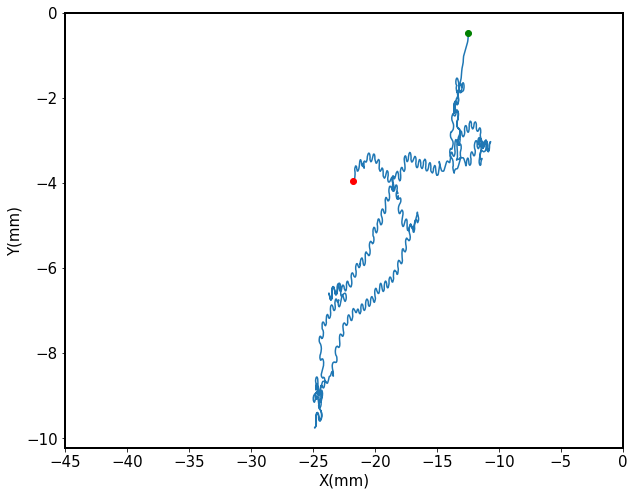

In [31]:
#path='/groups/zimmer/Daniel_Mitic/data/single_cell_calcium_imaging_bag_zim443/single_cell_calcium_imaging_tracks/position_table_bag/2021-07-20_15-15-13_bagworm3_on-TablePosRecord.txt'
path='/scratch/zimmer/DanielM/bag_zim_06/9.9/2021-09-06bag_zim06/raw/2021-09-06_19-05-32_worm4_on-TablePosRecord.txt'
x_ref=-6
df=pd.read_csv(path)


df = df.rename(columns={"y":"Y"})
#pixel conv
px_mm=0.00325

#df['X']=df['X']*px_mm #converting x data in pixels
df=df.groupby(np.arange(len(df))//10).mean()
print(df)

#substract the x_ref
df['X']=df['X']-x_ref
#figure parameters
font = {'size'   : 20}
#plt.rc('font', **font)
plt.rcParams['axes.linewidth'] = 2
ax=df.plot(x='X', y='Y', figsize=(10,8))
ax.plot(df['X'][0],df['Y'][0], 'go')
ax.plot(df['X'].tail(1),df['Y'].tail(1), 'ro')
#ax.plot(df['X'][0],df['Y'][0], 'go')
ax.set_xlabel('X(mm)',fontsize=15)
ax.set_ylabel('Y(mm)',fontsize=15)
ax.legend_.remove()
fontsize=15
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
#ax.set_ylabel('Y (mm)')
#ax.set_xlabel('X (mm)')
ax.tick_params(axis="x", labelsize=fontsize)
ax.tick_params(axis="y", labelsize=fontsize)
ax.set_xlim(-45, 0)
#ax.set_yticks([])
#ax.set_xticks([])
#select_indices = list(np.where(df["time"] == '19:15:40.348')[0])
#index=select_indices[0]
index1=250
index2=700
#ax.plot(df['X'][index1],df['Y'][index1], 'k')
#peak_index=[1000,3250]
#for i in range(len(peak_index)):
    #ax.plot(df['X'][peak_index[i]],df['Y'][peak_index[i]], 'ko')

#ax.axvline(x=0, ymin=0, ymax=1, lw=10, alpha=.5, color='y')

In [67]:
bag_rise=df['X'][400]
food=df['X'].tail(1)
abs(bag_rise-food)

5000    2.777983
Name: X, dtype: float64

In [42]:
bag_rise

12.806480000000002

In [62]:
food

5000    30.7992
Name: X, dtype: float64

In [19]:
#total distance in pixels.
#distnace in mm
df['X'].max()-df['X'].min()

5.542599999999999

-2.7481

In [59]:
a=-2
b=-16

In [55]:
a-b

14

In [56]:
16+24

40

In [ ]:
0
-40

0
-10

In [78]:
df['X']==-15.457799999999999

select_indices = list(np.where(df["time"] == '19:15:40.348')[0])
index=select_indices[0]

In [82]:
df['X'][29999]

-24.7261

In [118]:

peak_index=[250,700,1200,2650,3400,4550]
for i in range(len(peak_index)):
    print(i)

0
1
2
3
4
5


## Make Animations

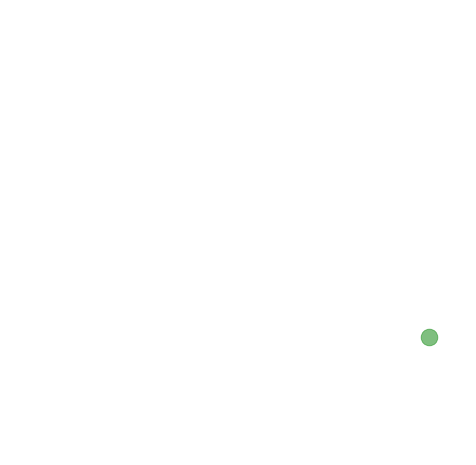

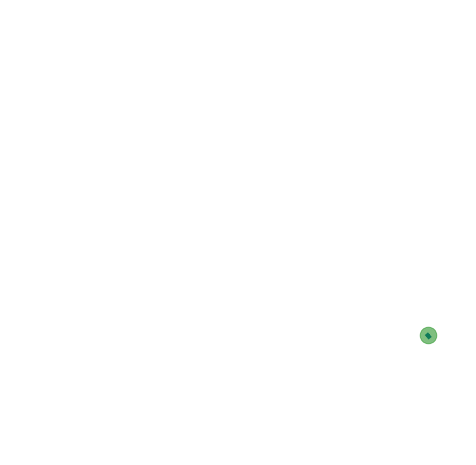

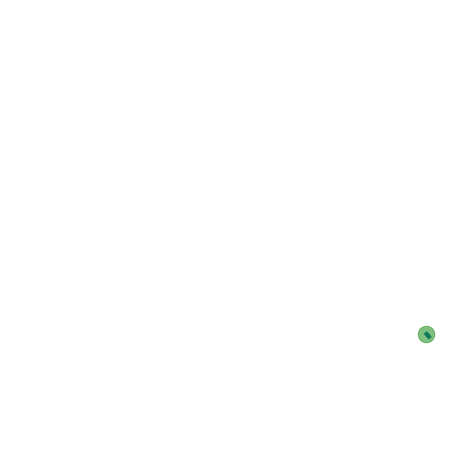

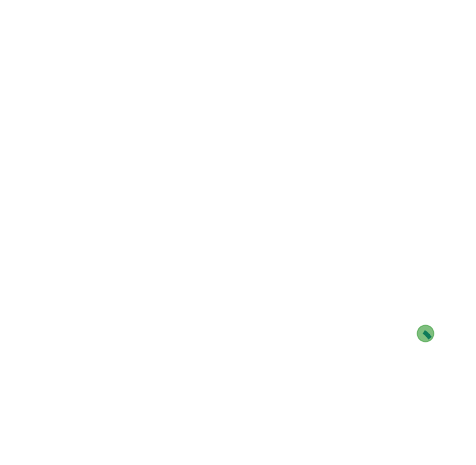

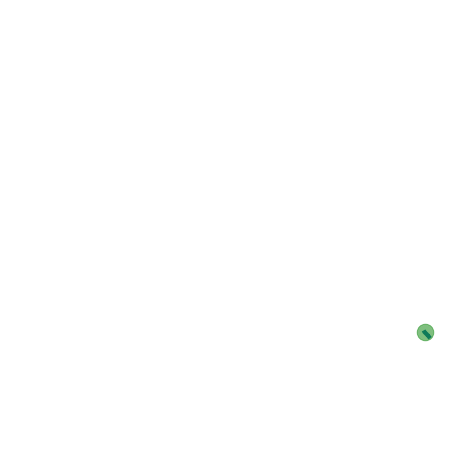

...

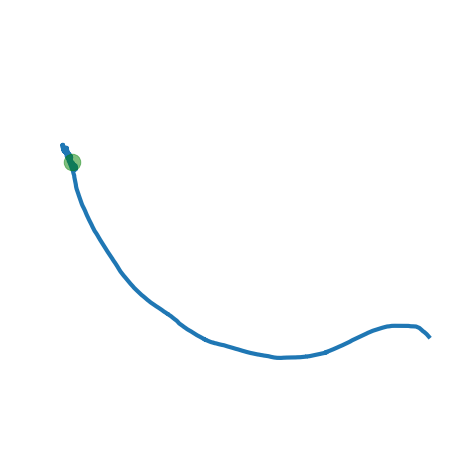

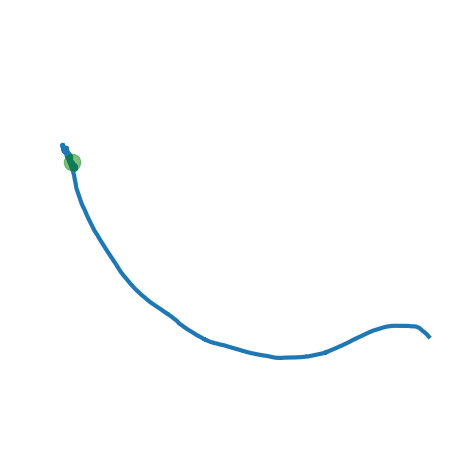

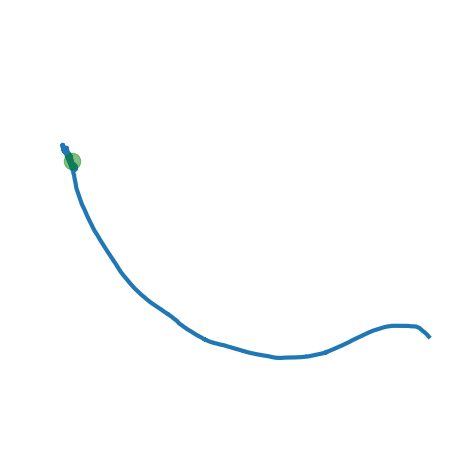

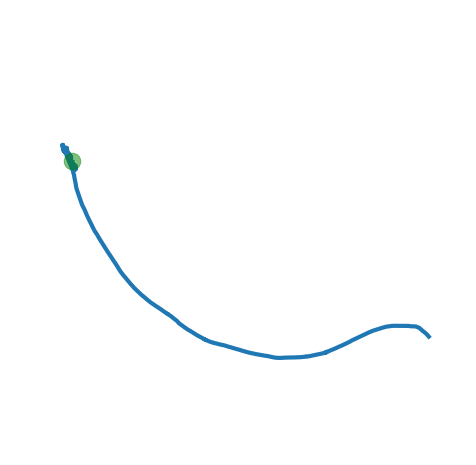

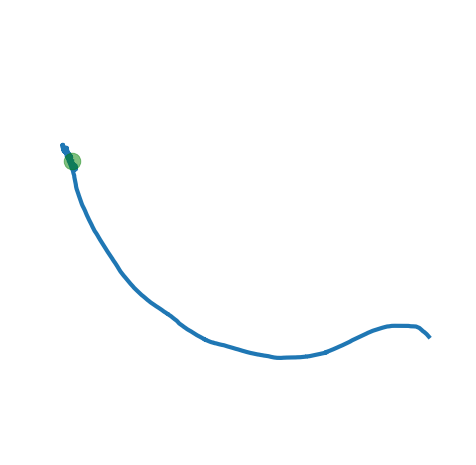

In [74]:
for idx, y in enumerate(df['y'].values[timepoints]):
    if idx%16!=0:continue
    fig=plt.figure(figsize=(10,10), dpi=60)
    plt.plot(df['x'].values[timepoints][0:idx],df['y'].values[timepoints][0:idx], linewidth=5)
    plt.plot(df['x'].values[timepoints][idx],df['y'].values[timepoints][idx], 'go', markersize=20, alpha=0.5)
    plt.axis('off')
    plt.ylim([10, 12])
    plt.xlim([8.8, 10.7])
    plt.show()
    fig.savefig('animation3/track'+str(idx)+'.png')
    plt.close(fig)
    #break

In [63]:
#this is how I calculated the x_ref for the control and for the on food where I did not annotate
known_x_ref=[4, 6.5,7.6,7.2,9,10.5,8.1,7.8,6.6,9.1] #1st round
known_x_ref=[3.71, 8.83, 5.49, 7.66, 10.31, 8, 8] #2nd round
np.mean(known_x_ref)
x_ref=np.mean(known_x_ref)
print(x_ref)

7.428571428571429


In [51]:
path='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/2nd_round/all_tracks/'
for filename in natsorted(os.listdir(path)):
    if filename.endswith('.txt'):
        print(filename,',',x_ref)

2020-11-10_13-47-38_chemotaxis_worm1-TablePosRecord.txt , 7.571428571428571
2020-11-10_14-44-27_chemotaxis_worm2-TablePosRecord.txt , 7.571428571428571
2020-11-10_15-50-59_chemotaxis_worm3-TablePosRecord.txt , 7.571428571428571
2020-11-10_16-18-13_chemotaxis_worm4-TablePosRecord.txt , 7.571428571428571
2020-11-10_17-37-39_chemotaxis_worm5-TablePosRecord.txt , 7.571428571428571
2020-11-10_18-13-59_control_worm1-TablePosRecord.txt , 7.571428571428571
2020-11-10_18-39-38_chemotaxisl_worm6-TablePosRecord.txt , 7.571428571428571
2020-11-11_10-51-56_control_worm1-TablePosRecord.txt , 7.571428571428571
2020-11-11_11-55-13_control_worm2-TablePosRecord.txt , 7.571428571428571
2020-11-11_13-08-36_chemotaxis_worm1-TablePosRecord.txt , 7.571428571428571
2020-11-11_14-07-01_chemotaxis_worm2-TablePosRecord.txt , 7.571428571428571
2020-11-11_14-55-44_chemotaxis_worm3-TablePosRecord.txt , 7.571428571428571
2020-11-11_15-22-32_chemotaxis_worm4-TablePosRecord.txt , 7.571428571428571
2020-11-11_17-11-02_

In [3]:

#i saved them into /groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/all_x_refs.csv
x_ref=pd.read_csv('/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/all_x_refs.csv')
x_ref.head(5)

,name,x_ref
0,2020-06-05_16-46-41_BHrecording1-TablePosRecor...,7.64
1,2020-06-05_18-01-23_worm4-TablePosRecord.txt,7.64
2,2020-06-05_18-30-40_worm6-TablePosRecord.txt,7.64
3,2020-06-05_19-00-03_worm7-TablePosRecord.txt,7.64
4,2020-06-05_19-28-25_worm9-TablePosRecord.txt,7.64


## Plot all tracks

                time       X        Y
200000  14:07:40.476  3.7114  24.5233


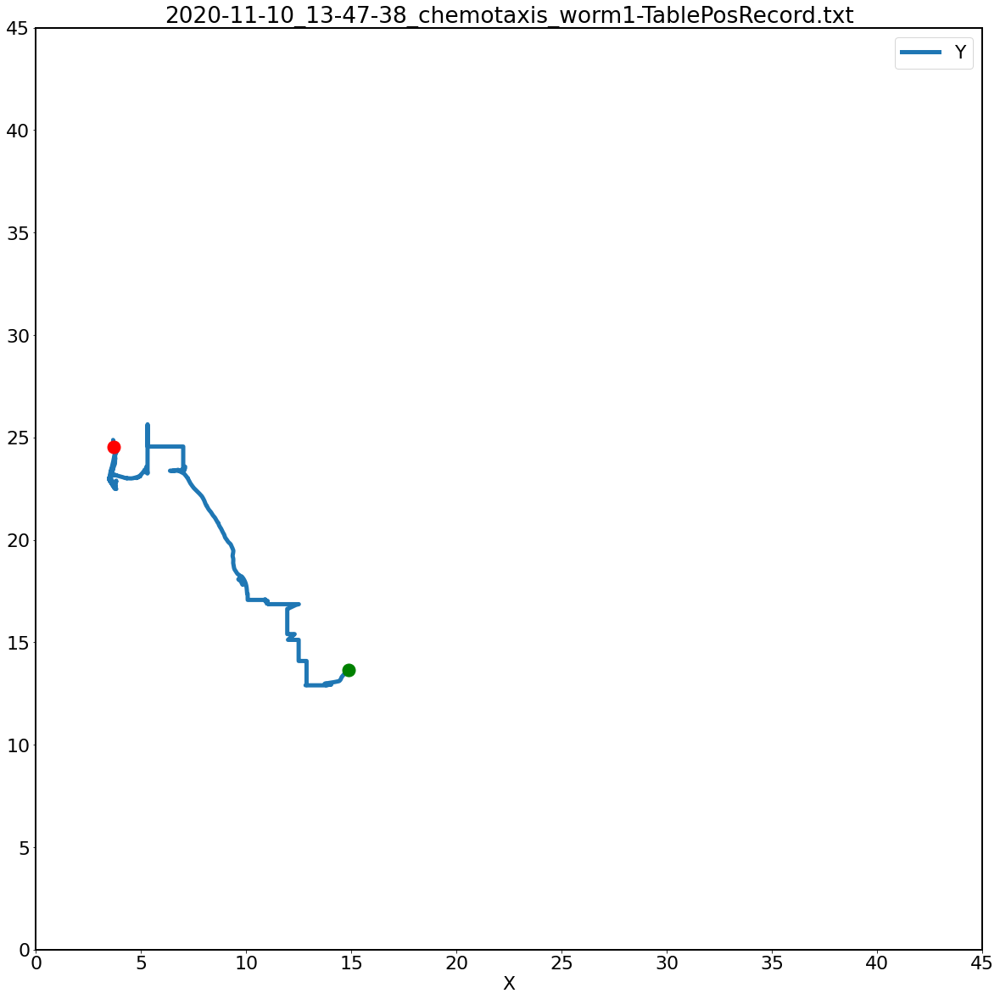

                time       X        Y
200000  15:04:29.529  8.8261  33.6214


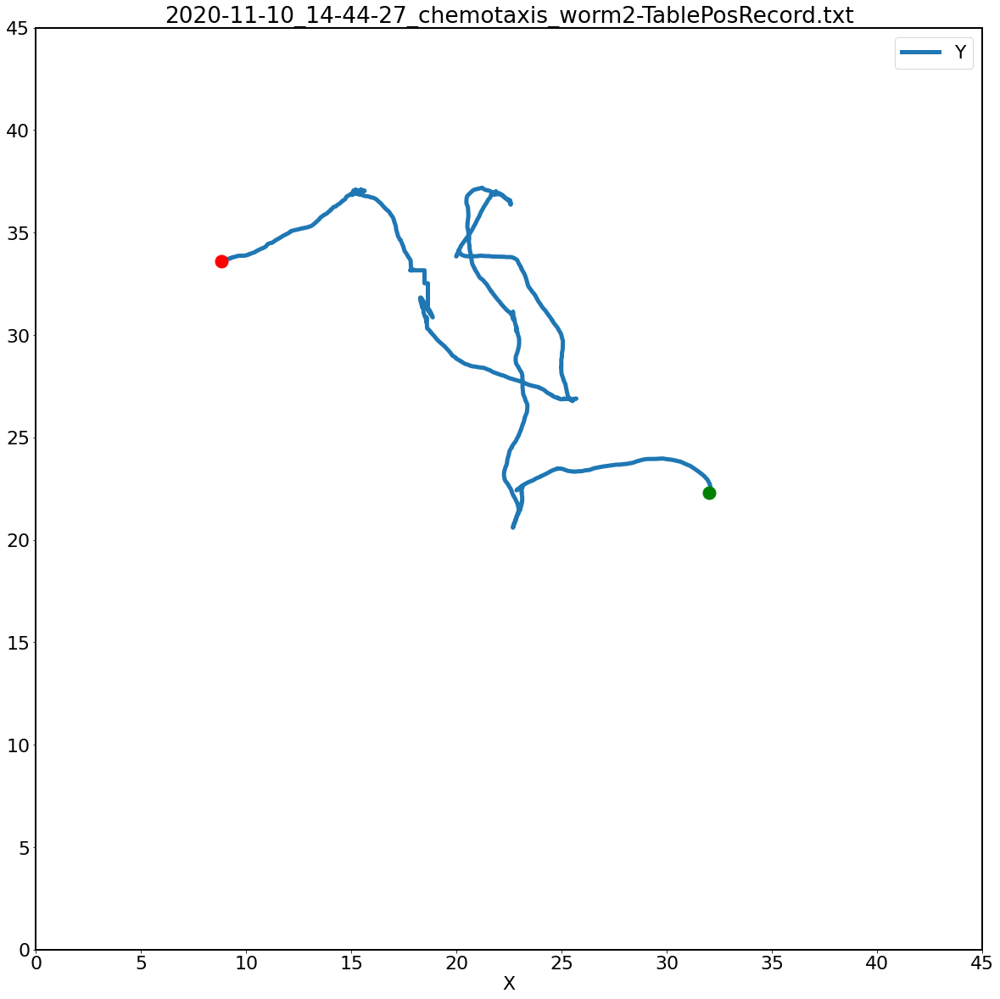

                time       X        Y
200000  16:11:02.633  5.4907  32.6283


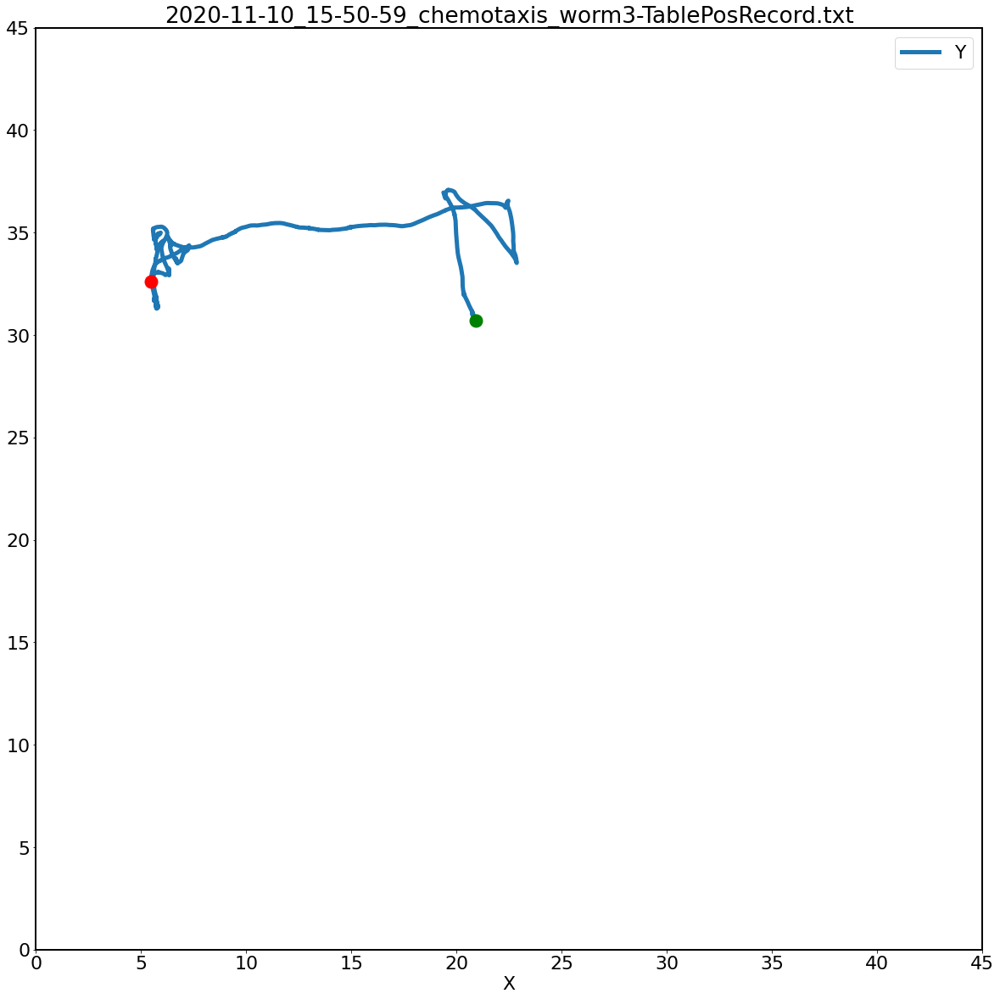

                time       X        Y
200000  16:38:16.865  7.6574  25.7152


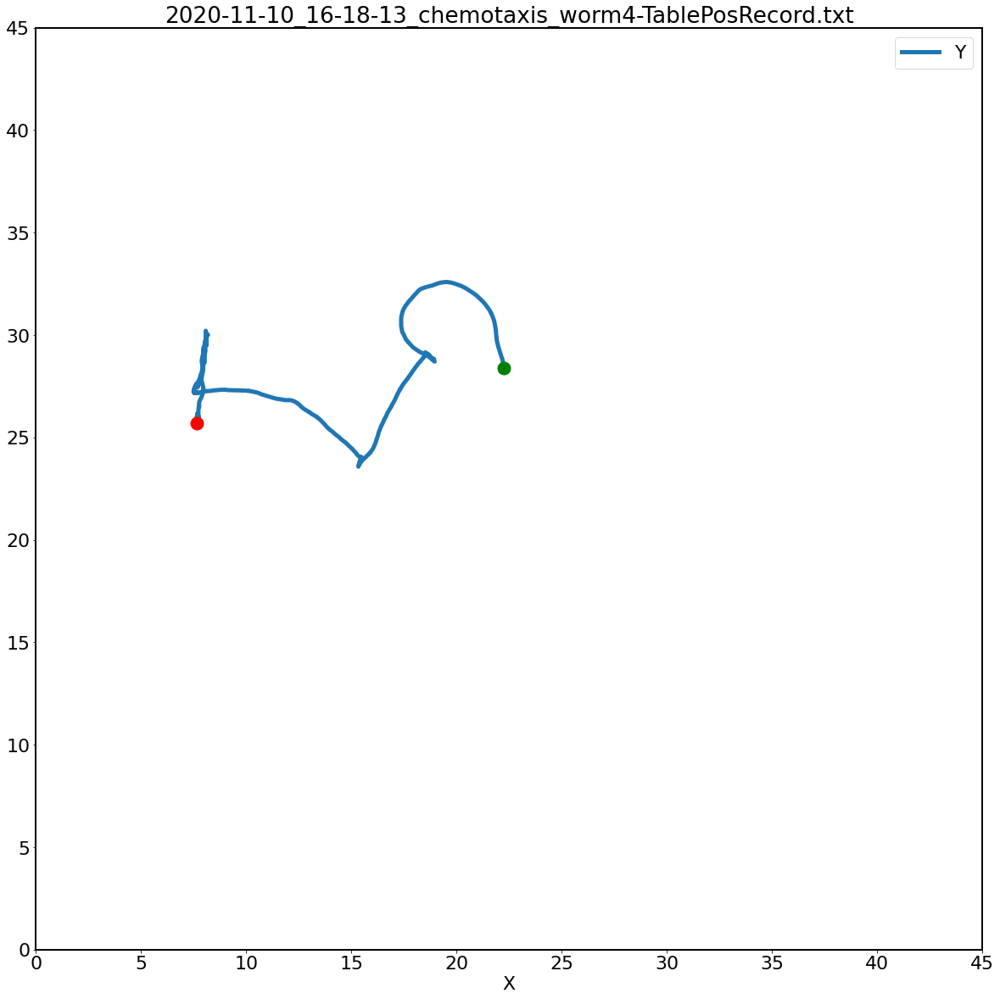

                time        X        Y
200000  17:57:41.560  18.8693  18.8085


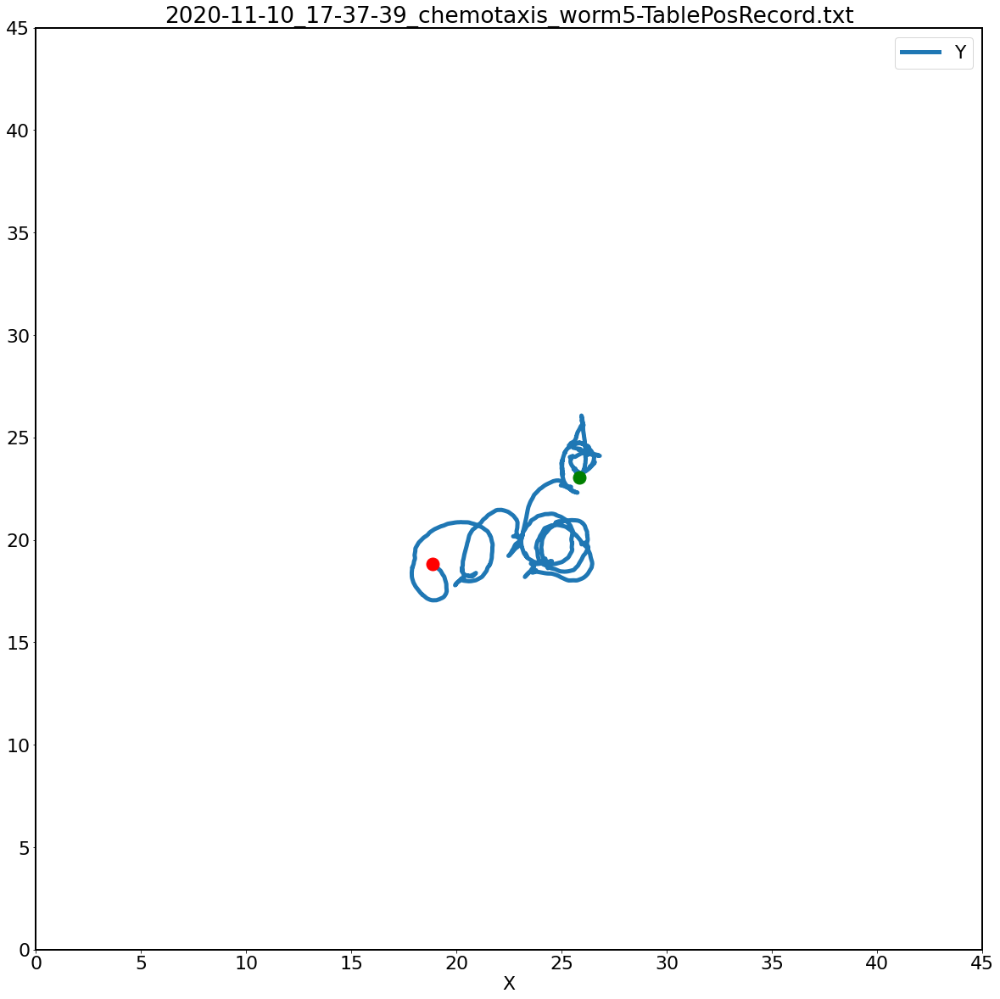

                time        X       Y
200000  18:34:03.131  37.9721  5.8558


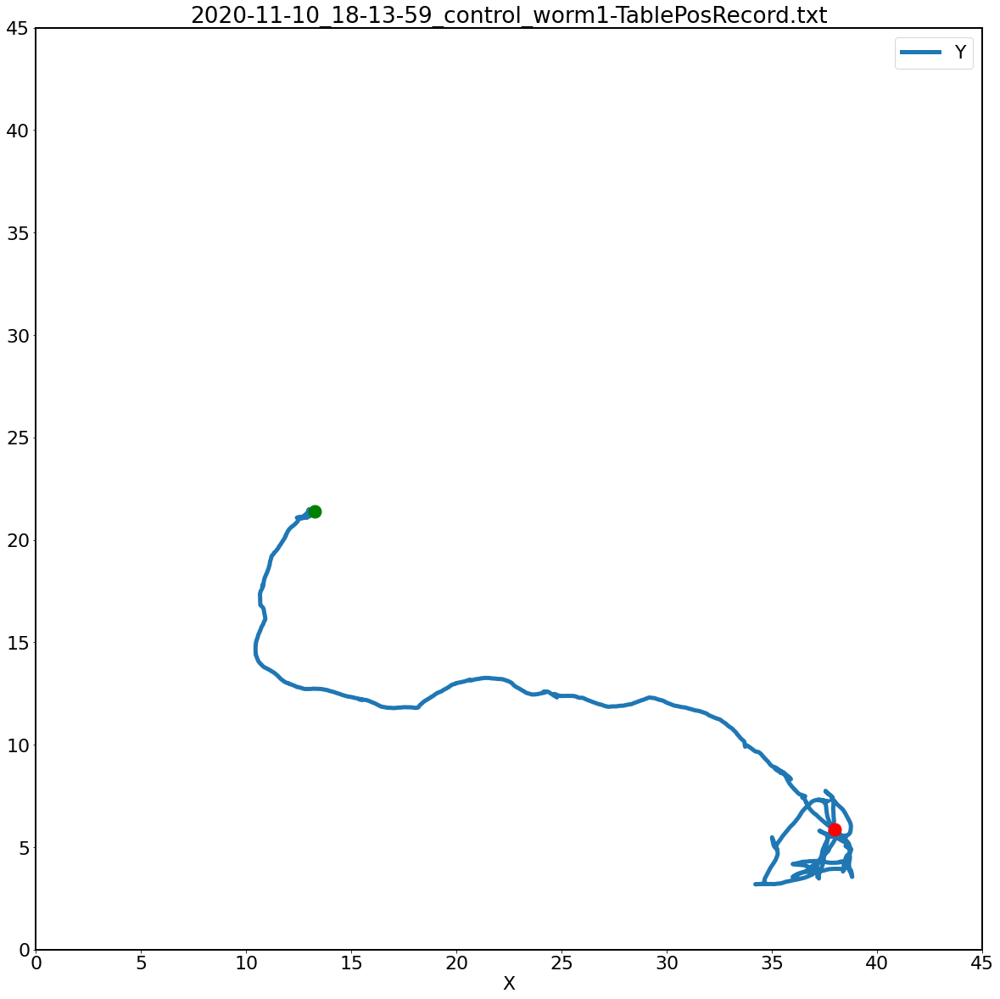

                time        X        Y
200000  18:59:42.969  41.6781  18.3565


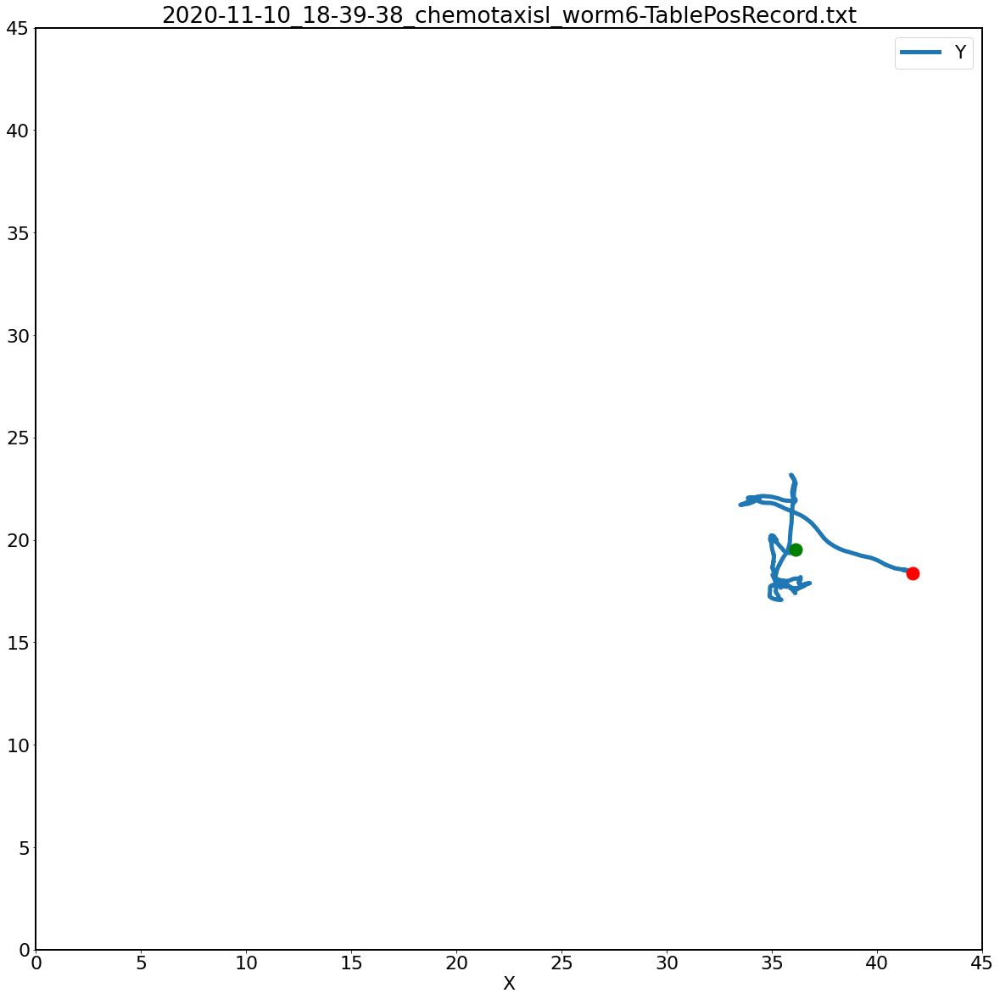

                time        X        Y
200000  11:11:59.084  20.1011  27.0235


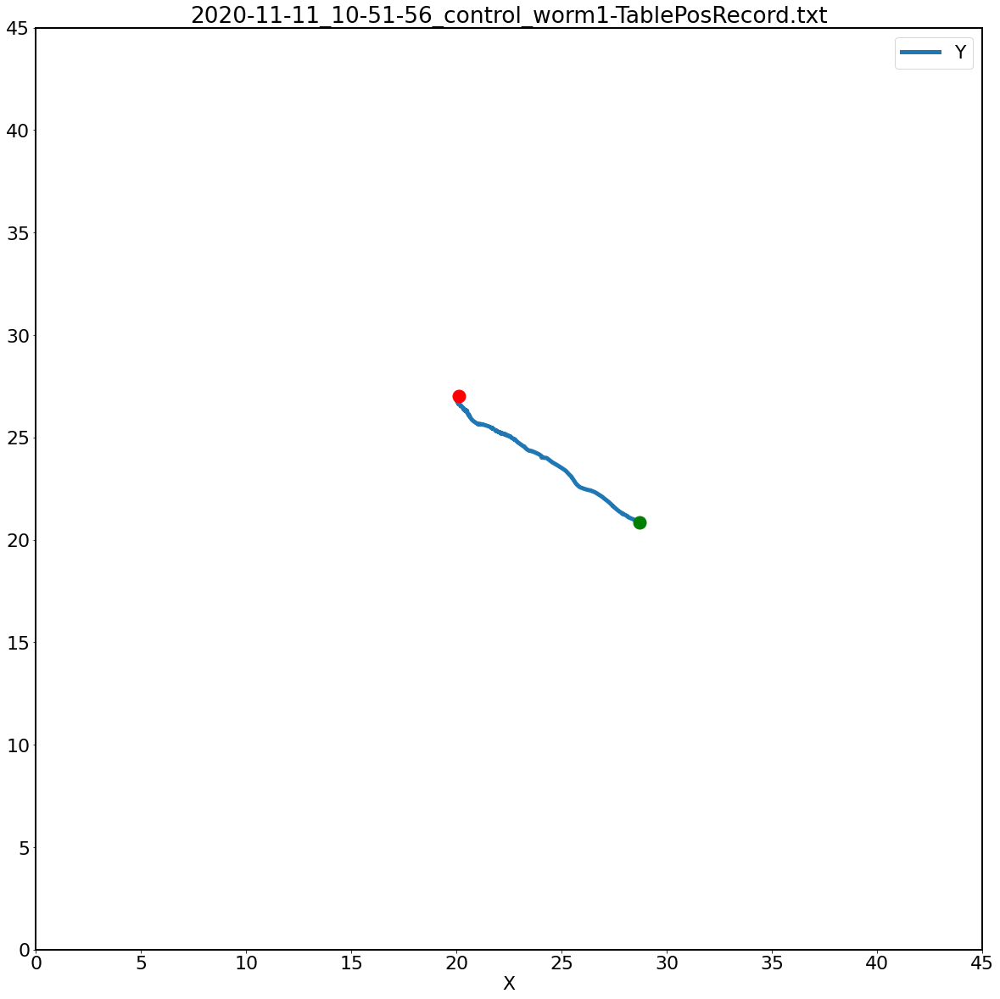

                time       X        Y
200000  12:15:19.130  26.676  35.6371


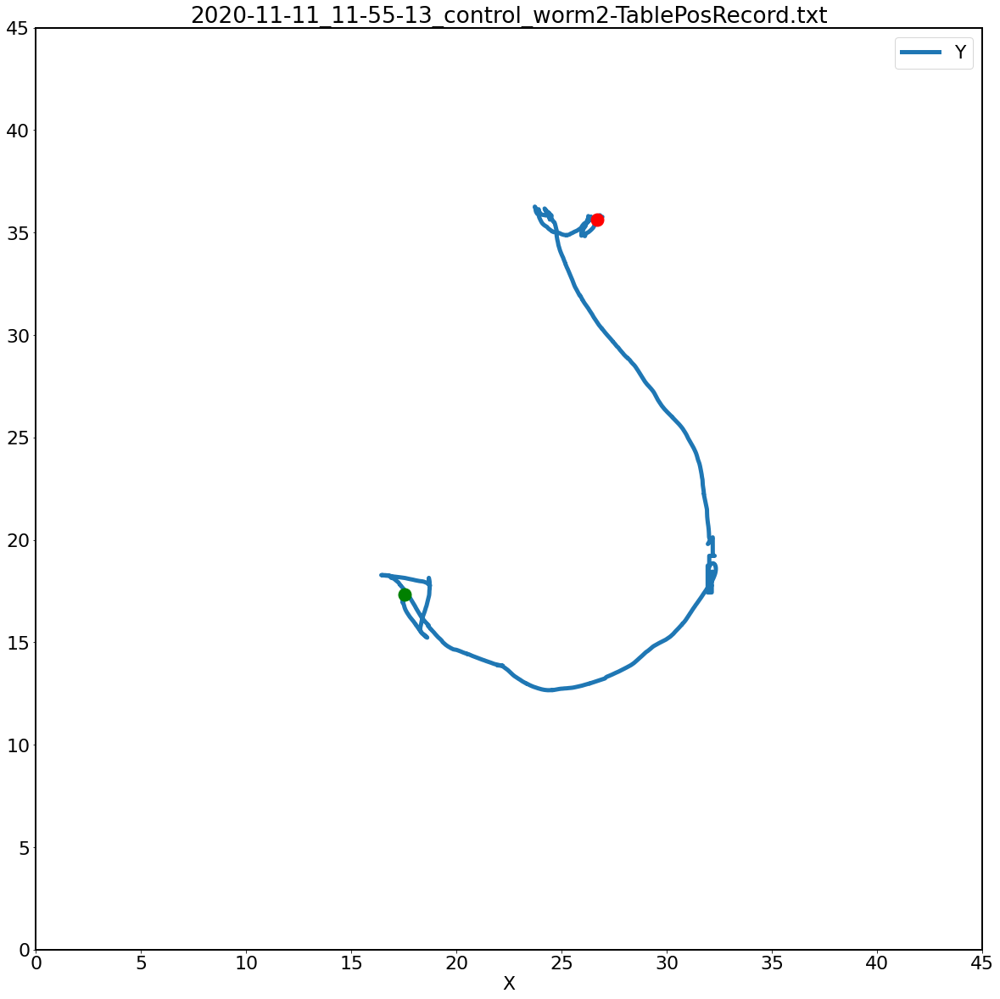

                time        X        Y
200000  13:28:39.073  15.3824  31.2687


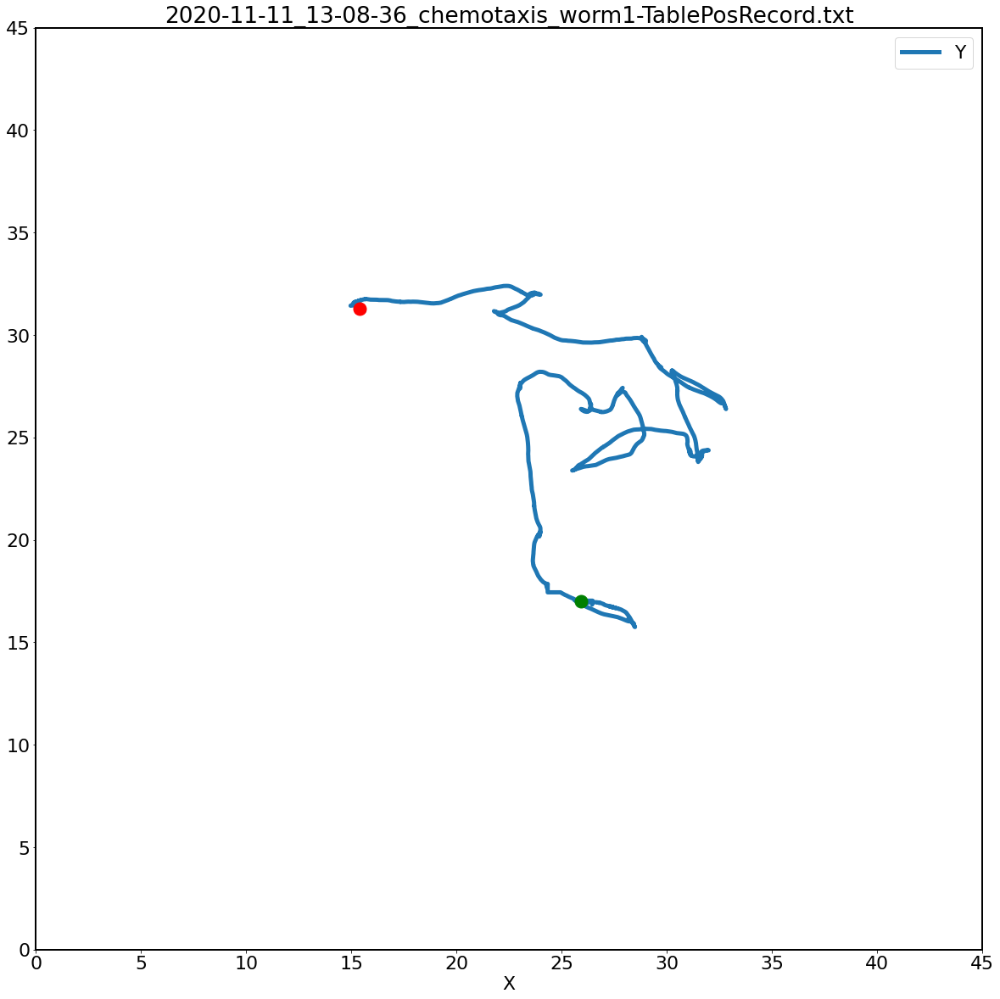

                time        X       Y
200000  14:27:13.430  10.3143  5.7643


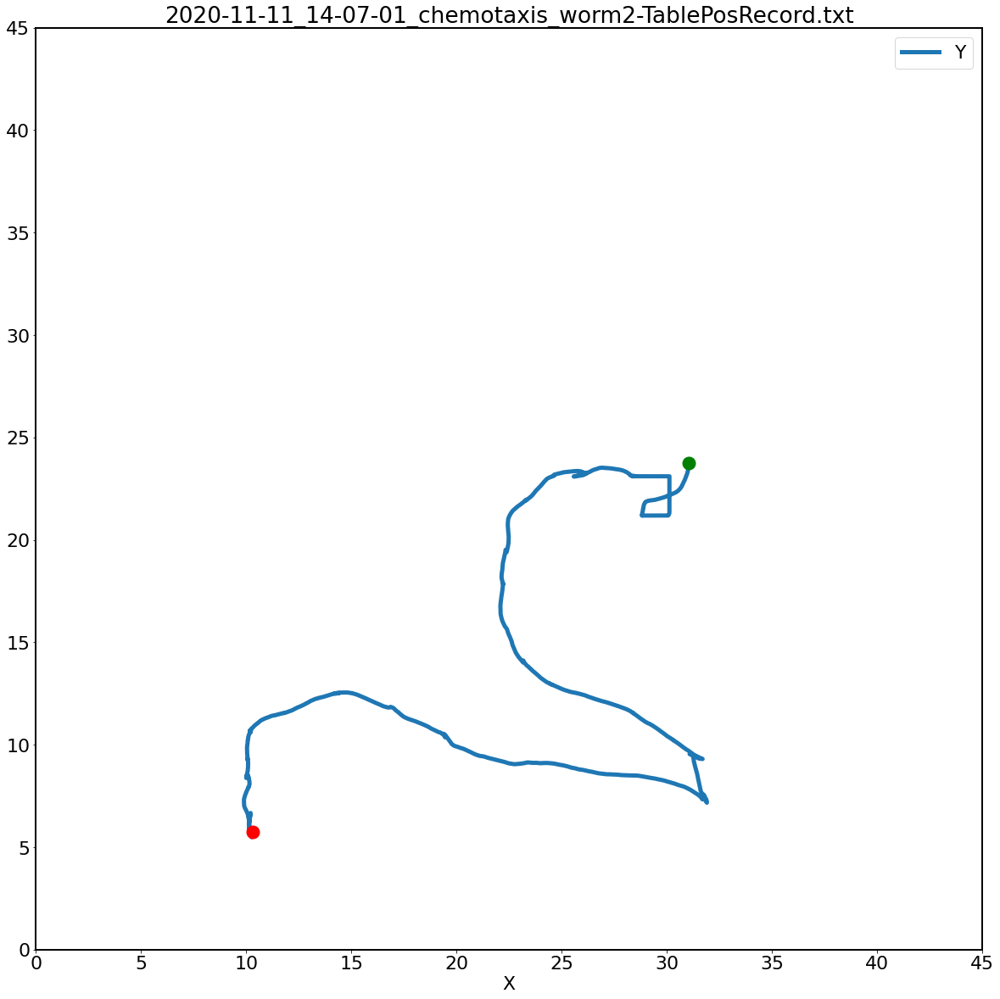

                time        X        Y
200000  15:15:49.744  28.4516  24.2406


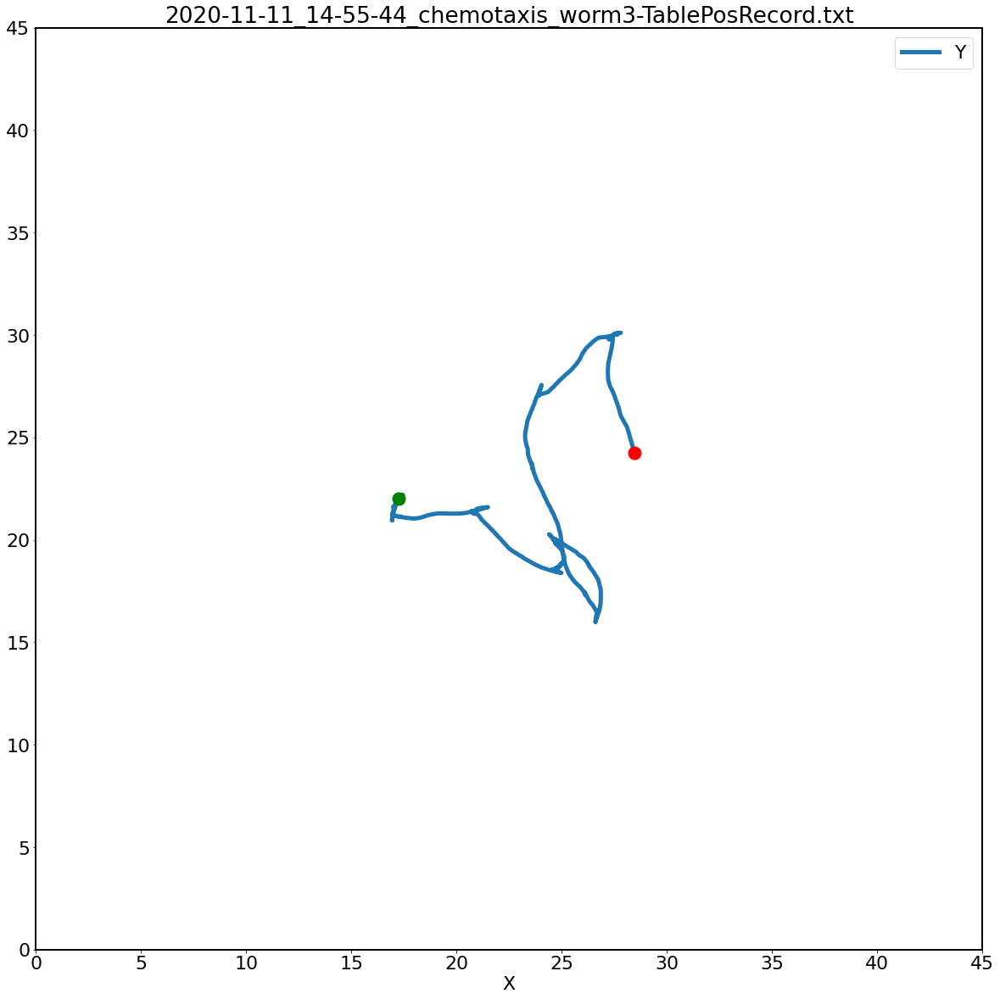

                time       X        Y
200000  15:42:39.428  9.3179  26.8796


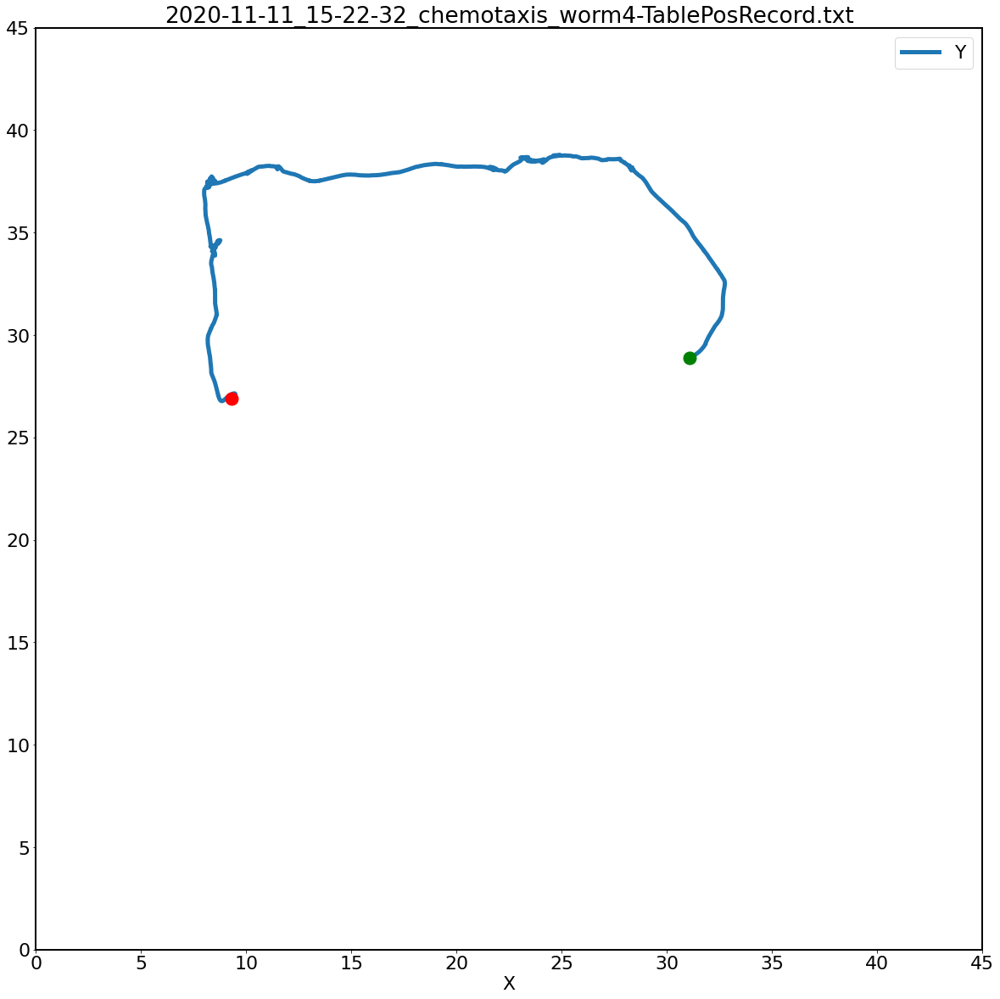

                time       X        Y
200000  17:31:04.581  8.2305  35.1056


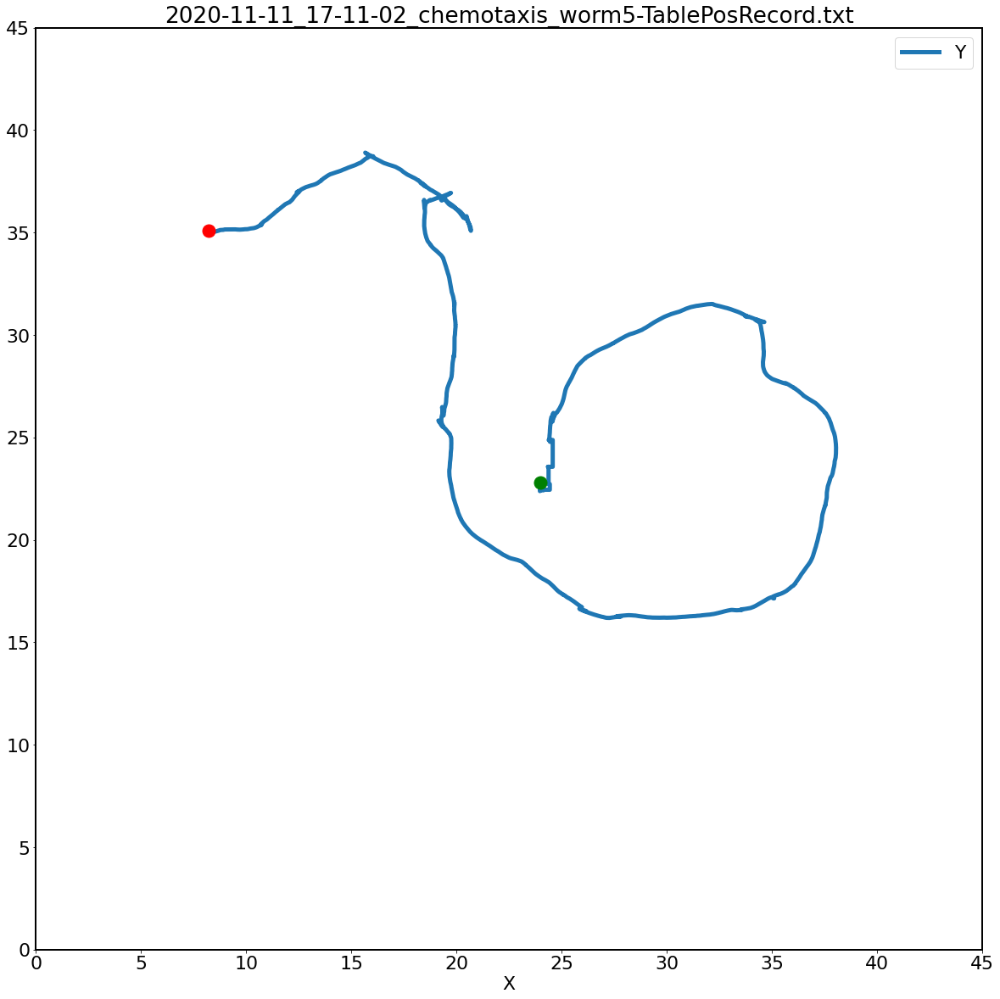

                time        X       Y
200000  18:07:09.231  27.8482  20.967


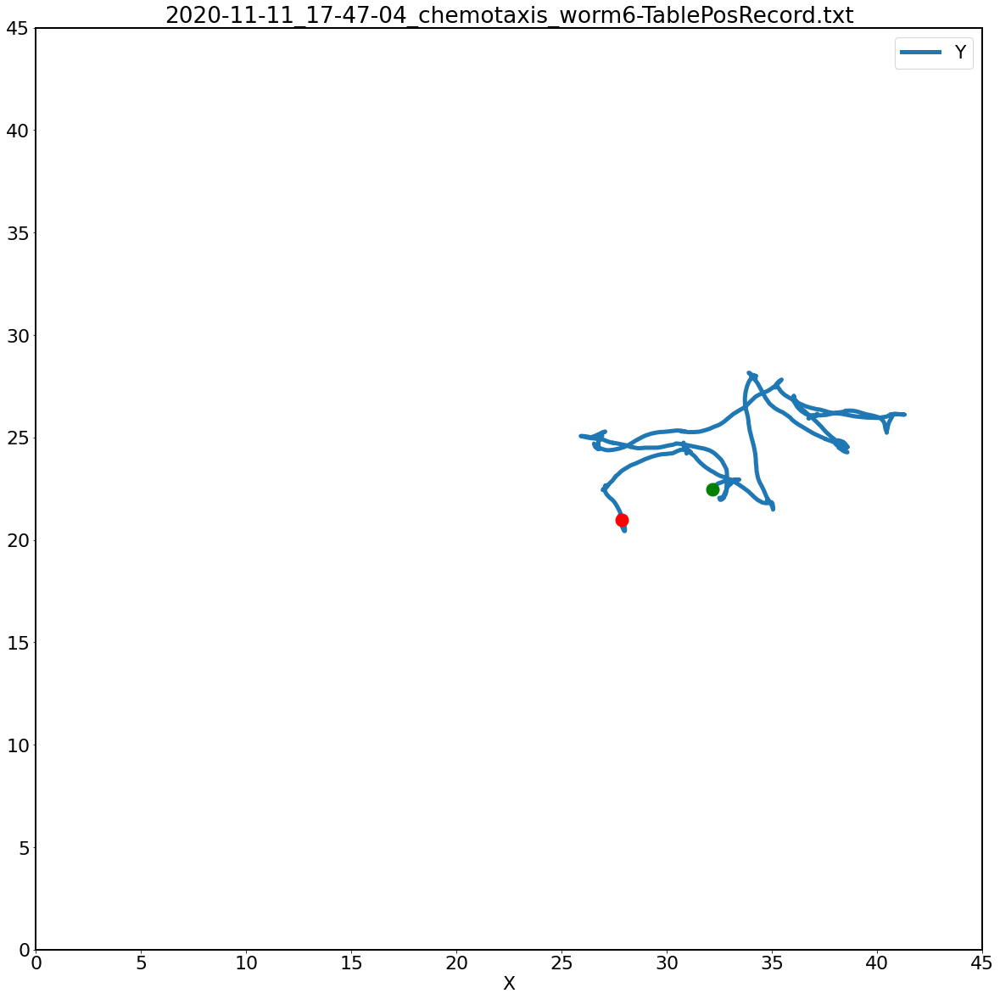

                time      X        Y
200000  18:32:50.912  7.212  27.6052


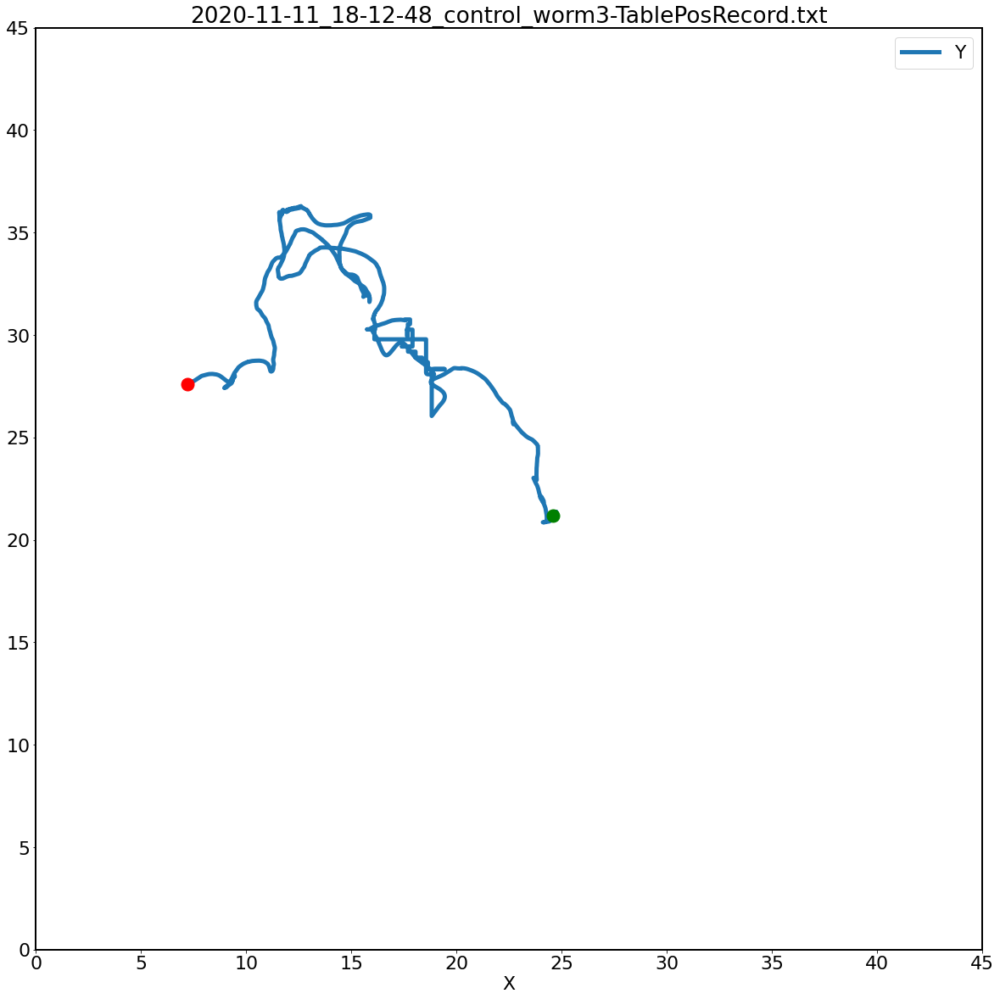

                time        X        Y
200000  19:00:28.093  11.2759  32.5005


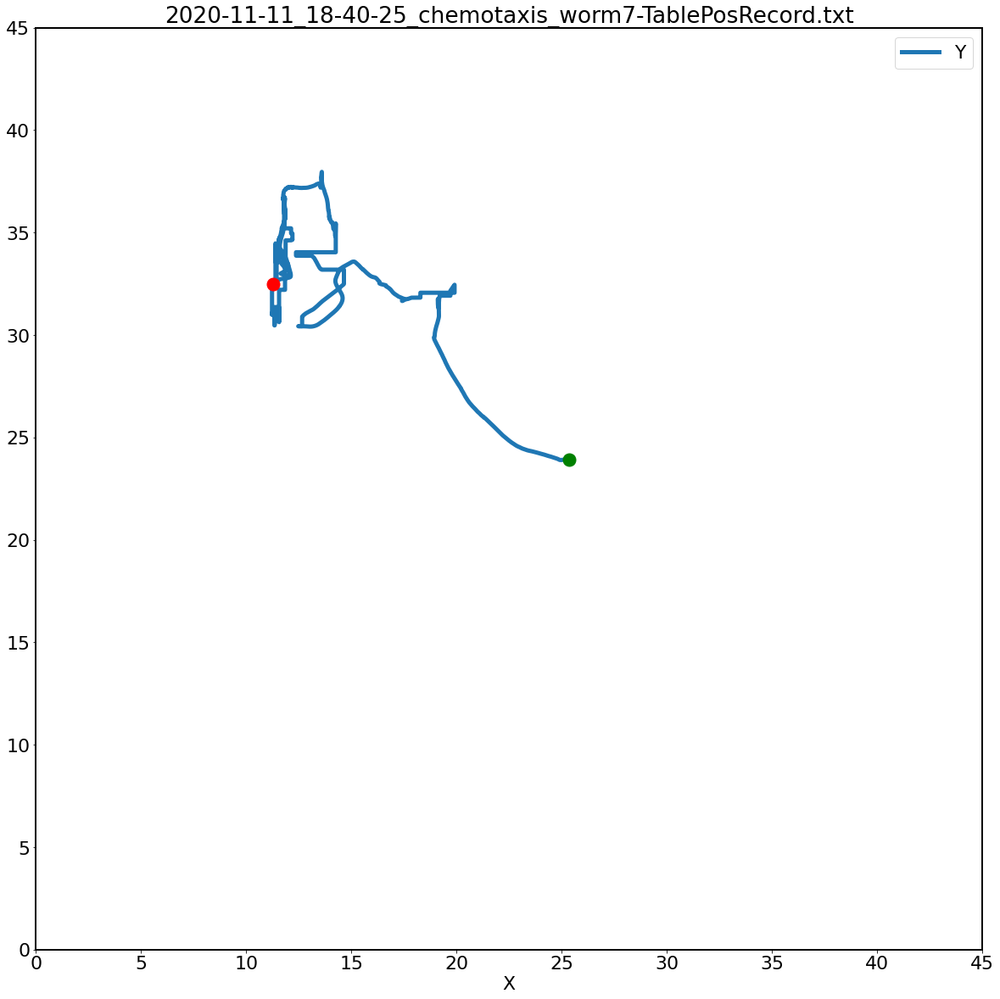

In [41]:
# file path
path='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/2nd_round/all_tracks/'


#all_x_ref=pd.read_csv('/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/all_x_refs.csv')

#remove the limit of figures to plot
plt.rcParams.update({'figure.max_open_warning': 0})


#THIS IS FOR WITHOUT REF
for filename in natsorted(os.listdir(path)):
    if filename.endswith('Record.txt'):
        plot_tracks(path+filename)
        plt.title(filename)
        plt.show()
        #plt.savefig('new_output/'+filename+'.tiff')
        #plt.close('all)')



## Plot all ref tracks

0 : x ref of  2020-11-10_13-47-38_chemotaxis_worm1-TablePosRecord.txt is:  3.71
1 : x ref of  2020-11-10_14-44-27_chemotaxis_worm2-TablePosRecord.txt is:  8.83
2 : x ref of  2020-11-10_15-50-59_chemotaxis_worm3-TablePosRecord.txt is:  5.49
3 : x ref of  2020-11-10_16-18-13_chemotaxis_worm4-TablePosRecord.txt is:  7.66
4 : x ref of  2020-11-10_17-37-39_chemotaxis_worm5-TablePosRecord.txt is:  7.43
5 : x ref of  2020-11-10_18-13-59_control_worm1-TablePosRecord.txt is:  7.43
6 : x ref of  2020-11-10_18-39-38_chemotaxisl_worm6-TablePosRecord.txt is:  7.43
7 : x ref of  2020-11-11_10-51-56_control_worm1-TablePosRecord.txt is:  7.43
8 : x ref of  2020-11-11_11-55-13_control_worm2-TablePosRecord.txt is:  7.43
9 : x ref of  2020-11-11_13-08-36_chemotaxis_worm1-TablePosRecord.txt is:  7.43
10 : x ref of  2020-11-11_14-07-01_chemotaxis_worm2-TablePosRecord.txt is:  10.31
11 : x ref of  2020-11-11_14-55-44_chemotaxis_worm3-TablePosRecord.txt is:  7.43
12 : x ref of  2020-11-11_15-22-32_chemotaxis

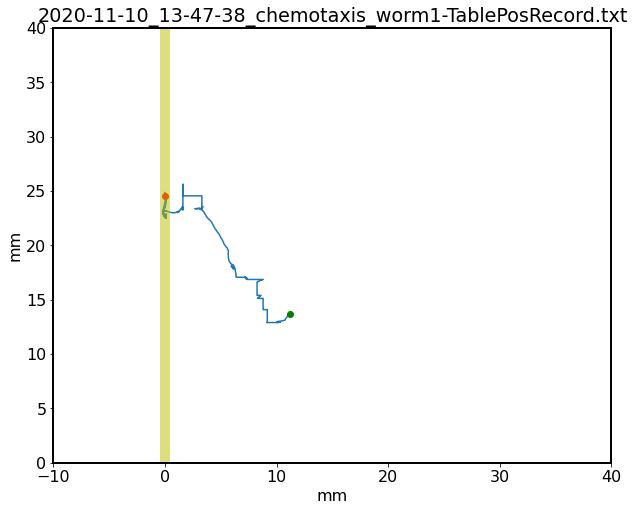

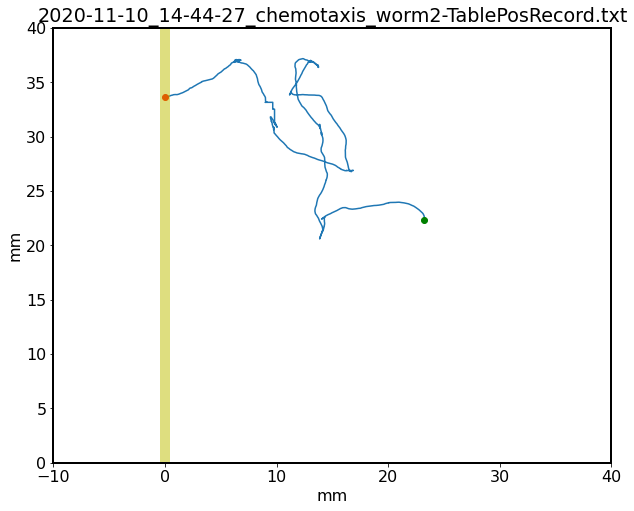

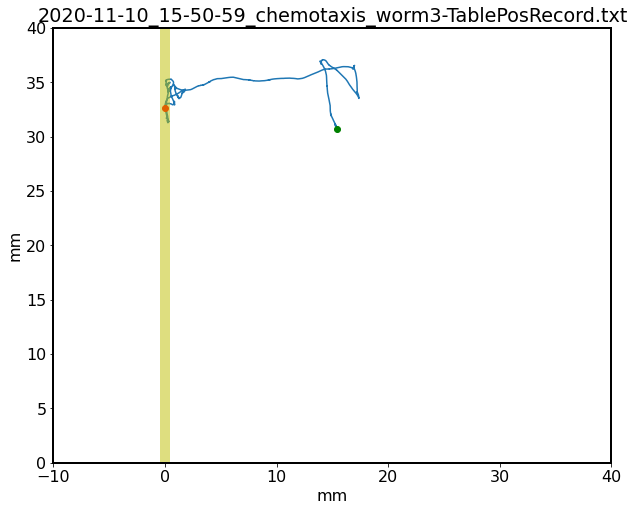

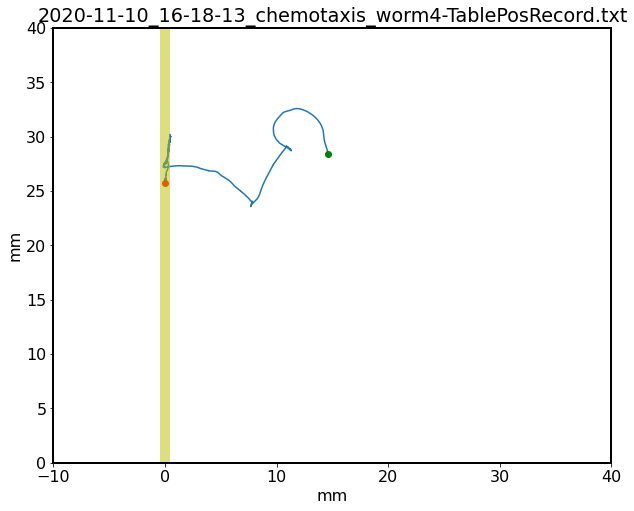

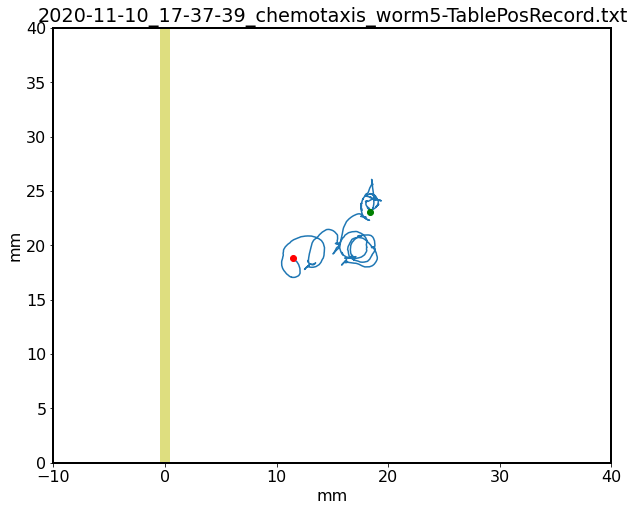

...

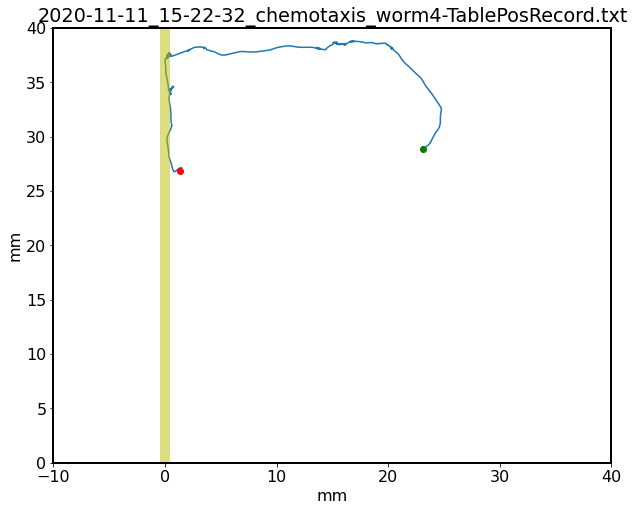

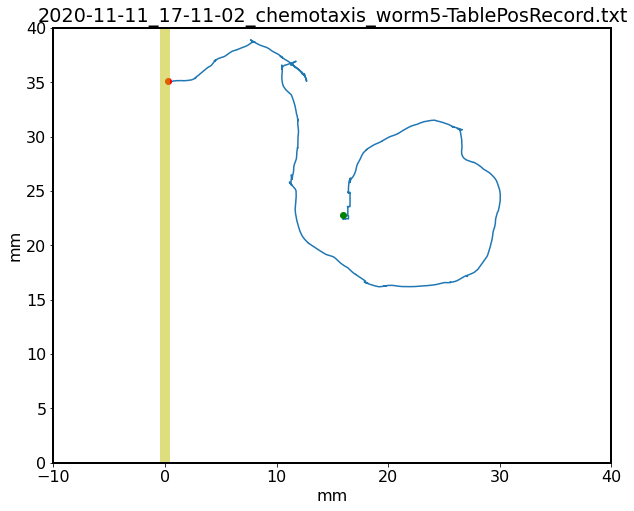

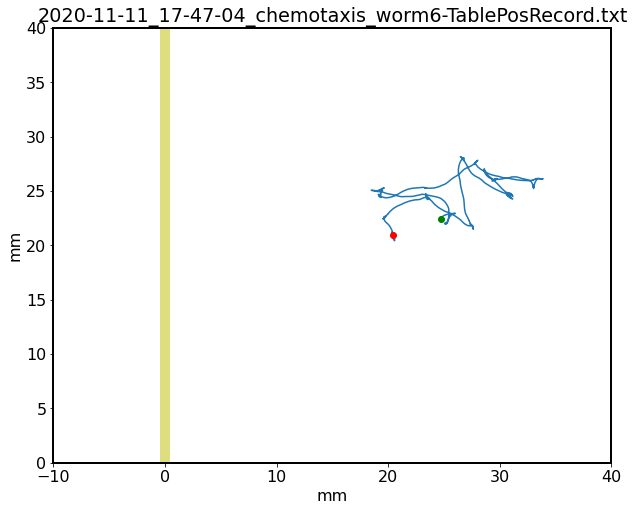

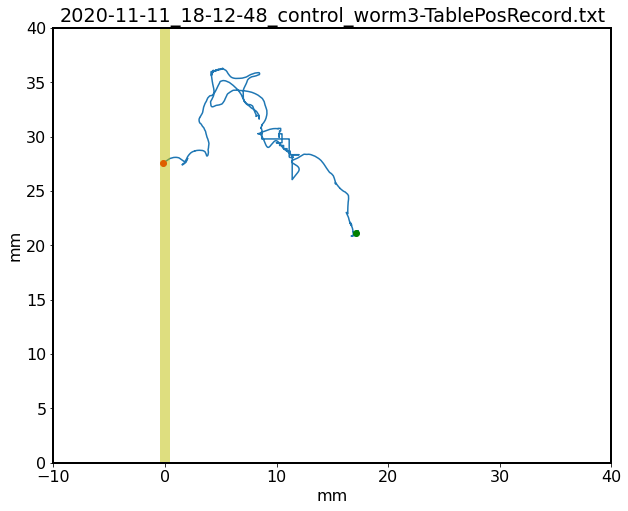

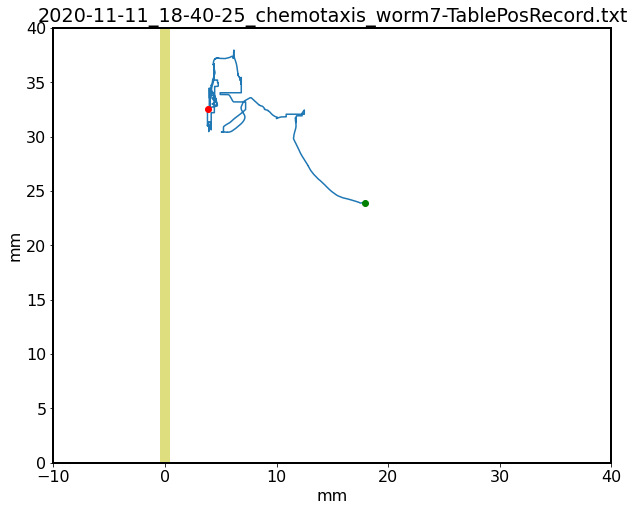

In [2]:
# file path
#1st round
path='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/all_tracks/'
all_x_ref=pd.read_csv('/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/all_x_refs.csv')

#2nd round
path='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/2nd_round/all_tracks/'
all_x_ref=pd.read_csv('/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/2nd_round/all_x_refs.csv')

#remove the limit of figures to plot
plt.rcParams.update({'figure.max_open_warning': 0})

for i, filename in enumerate(natsorted(os.listdir(path))):
    if filename.endswith('Record.txt'):
        x_ref=all_x_ref['x_ref'][i]
        print(i, ': x ref of ', filename, 'is: ', x_ref)
        plot_tracks_with_ref(path+filename,x_ref)
        plt.title(filename)
            #plt.savefig(path+filename+'.tiff')
            #plt.close('all)')

## Calculate Speed

In [3]:
path_to_csv='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/2nd_round/all_tracks/2020-11-11_14-55-44_chemotaxis_worm3-TablePosRecord.txt'
data_df=pd.read_csv(path_to_csv)

In [12]:
new_path='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/avi_all/2020-06-05_16-46-41_worm1-channel-0-bigtiffDLC_resnet50_HeadTailAug10shuffle1_275000_filtered.h5'

In [13]:
data_df=pd.read_hdf(new_path)

In [4]:
data_df

,time,X,Y
0,14:55:49.702,17.2668,21.9952
1,14:55:49.702,17.2668,21.9952
2,14:55:49.718,17.2668,21.9952
3,14:55:49.718,17.2668,21.9952
4,14:55:49.718,17.2674,21.9954
...,...,...,...
199996,15:15:49.712,28.4511,24.2440
199997,15:15:49.728,28.4512,24.2433
199998,15:15:49.728,28.4513,24.2425
199999,15:15:49.728,28.4515,24.2416


In [23]:
#create the Time Elapsed (should be based on time)
data_df['Time Elapsed']=np.arange(0, 6*200001,6)

In [24]:
data_df.columns

Index(['time', 'X', 'Y', 'Time Elapsed'], dtype='object')

In [25]:
data_df.head(2)

,time,X,Y,Time Elapsed
0,14:55:49.702,17.2668,21.9952,0
1,14:55:49.702,17.2668,21.9952,6


In [26]:
#delete columns xc and yc if they exist (in old version, 1st round)
del data_df['xc']
del data_df['yc']

KeyError: 'xc'

In [27]:
#delete time if needed
del data_df['time']

In [28]:
data_df.head(2)

,X,Y,Time Elapsed
0,17.2668,21.9952,0
1,17.2668,21.9952,6


In [29]:
#run the function
speed_df=calculate_speeds(data_df)

(0.0, 0.1)

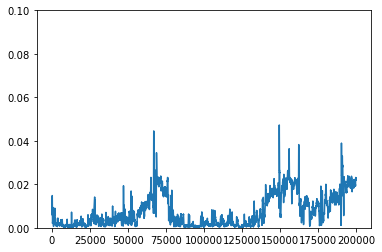

In [48]:
#plot speed
plt.plot(speed_df['Speed'].rolling(window=167,center=True).mean()*167)
plt.ylim([0, 0.1])

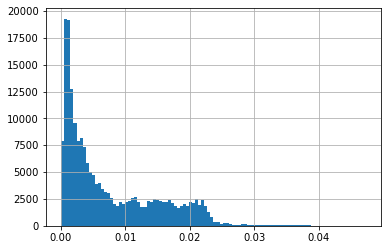

In [47]:
(speed_df['Speed'].rolling(window=167,center=True).mean()*167).hist(bins=100)